<a href="https://colab.research.google.com/github/Dushani-Ranasinghe/Pediatric-Bone-Age-Prediction/blob/main/Nexero.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

### **Image Preprocessing**

Import Libraries

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import os
import cv2
import random
import seaborn as sns
from scipy.ndimage import gaussian_filter
from PIL import Image
import shutil

Mount the drive

In [ ]:
#from google.colab import drive
#drive.flush_and_unmount()

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


Load RSNA Dataset

In [ ]:
# Load the CSV file
df = pd.read_csv('/content/drive/MyDrive/FYP - Nexero/Datasets/RSNA/boneage-training-dataset.csv')

In [ ]:
#appending file extension to id column for both training dataframe
df['id'] = df['id'].apply(lambda x: str(x)+'.png')
df.head()

,id,boneage,male
0,1377.png,180,False
1,1378.png,12,False
2,1379.png,94,False
3,1380.png,120,True
4,1381.png,82,False


gender
male      6833
female    5778
Name: count, dtype: int64


<Axes: xlabel='gender', ylabel='count'>

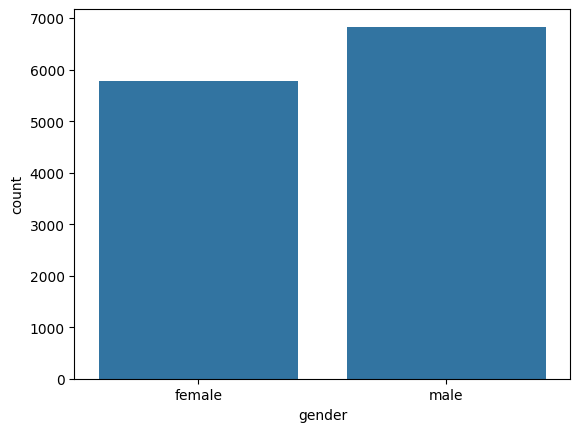

In [ ]:
#finding out the number of male and female children in the dataset
#creating a new column called gender to keep the gender of the child as a string
df['gender'] = df['male'].apply(lambda x: 'male' if x else 'female')
print(df['gender'].value_counts())
sns.countplot(x = df['gender'])

Get statistcal summary of dataset

In [ ]:
df.describe()


,boneage
count,12611.000000
mean,127.320752
std,41.182021
min,1.000000
25%,96.000000
50%,132.000000
75%,156.000000
max,228.000000


In [ ]:
#oldest child in the dataset
print('MAX age: ' + str(df['boneage'].max()) + ' months')

#youngest child in the dataset
print('MIN age: ' + str(df['boneage'].min()) + ' months')

#mean age is
mean_bone_age = df['boneage'].mean()
print('mean: ' + str(mean_bone_age))

#median bone age
print('median: ' +str(df['boneage'].median()))

#standard deviation of boneage
std_bone_age = df['boneage'].std()

#models perform better when features are normalised to have zero mean and unity standard deviation
# Min-Max Scaling
# Calculate the minimum and maximum values of the 'boneage' column
min_bone_age = df['boneage'].min()
max_bone_age = df['boneage'].max()

# Apply Min-Max scaling formula
df['bone_age_minmax'] = (df['boneage'] - min_bone_age) / (max_bone_age - min_bone_age)


print(df.head())

MAX age: 228 months
MIN age: 1 months
mean: 127.3207517246848
median: 132.0
         id  boneage   male  gender  bone_age_minmax
0  1377.png      180  False  female         0.788546
1  1378.png       12  False  female         0.048458
2  1379.png       94  False  female         0.409692
3  1380.png      120   True    male         0.524229
4  1381.png       82  False  female         0.356828


# Check for missing data

In [ ]:
# Check for missing data  -----------------------------------
missing_data = df.isnull().sum()

# Display the count of missing values for each column
print("Missing Data Count:")
print(missing_data)

Missing Data Count:
id                 0
boneage            0
male               0
gender             0
bone_age_minmax    0
dtype: int64


In [ ]:
# Function to check if ID ends with ".png" (case-insensitive)
def has_png_extension(id):
  return id.lower().endswith(".png")

# Extract IDs and construct filenames with proper extension handling
image_ids = df['id'].astype(str).values
filenames = [id + '.png' if not has_png_extension(id) else id for id in image_ids]

# Define the dataset directory
dataset_dir = '/content/drive/MyDrive/FYP - Nexero/Datasets/RSNA/boneage-training-dataset'
missing_files = []

# Check for missing files
for filename in filenames:
  filepath = os.path.join(dataset_dir, filename)
  if not os.path.exists(filepath):
    missing_files.append(filename)

if not missing_files:
  print("No missing files found. All files in the CSV are in the dataset.")
else:
  print("Missing files:")
  for missing_file in missing_files:
    print(missing_file)

No missing files found. All files in the CSV are in the dataset.


# Data Visualization

Text(0.5, 1.0, 'Number of children in each age group')

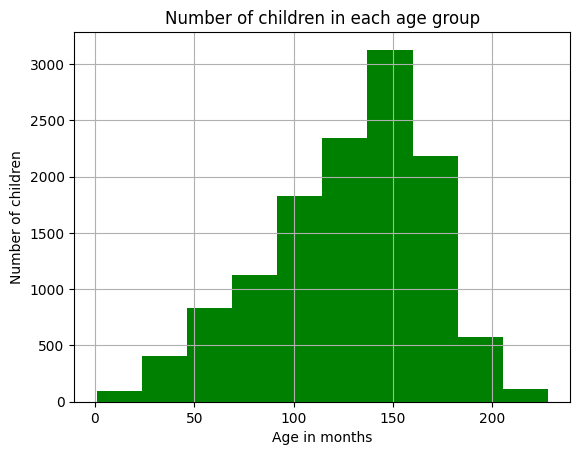

In [ ]:
#plotting a histogram for bone ages
df['boneage'].hist(color = 'green')
plt.xlabel('Age in months')
plt.ylabel('Number of children')
plt.title('Number of children in each age group')

Text(0.5, 1.0, 'Distribution of scaled bone age')

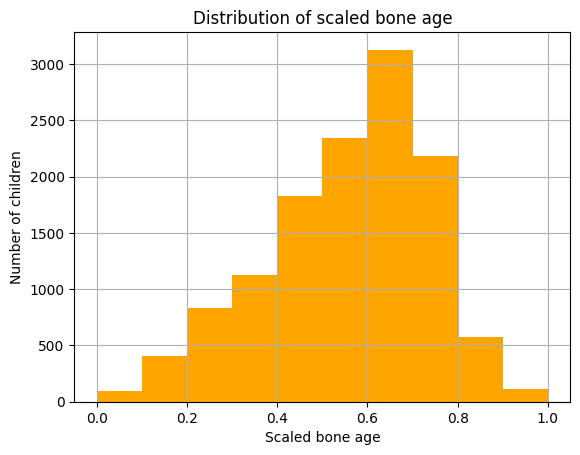

In [ ]:
# Explore the distribution of scaled bone age
df['bone_age_minmax'].hist(color='orange')
plt.xlabel('Scaled bone age')
plt.ylabel('Number of children')
plt.title('Distribution of scaled bone age')

In [ ]:
#Relationship between age and gender with a categorical scatter plot (swarmplot)
# Set the marker size
#marker_size = 3

# Create the swarmplot with reduced marker size
#sns.swarmplot(x=df['gender'], y=df['boneage'], size=marker_size)

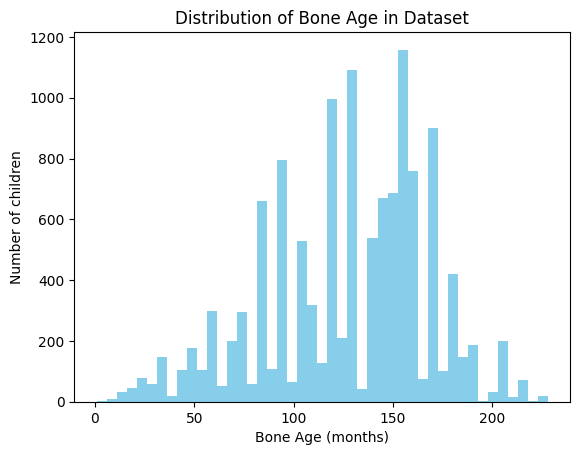

In [ ]:
# Plot bone age distribution
plt.hist(df['boneage'], bins='auto', color='skyblue')
plt.xlabel('Bone Age (months)')
plt.ylabel('Number of children')
plt.title('Distribution of Bone Age in Dataset')
plt.show()


<Axes: xlabel='boneage', ylabel='Count'>

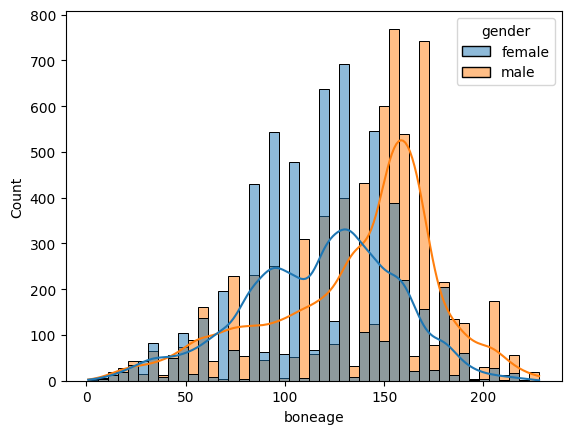

In [ ]:
#Relationship Between Bone Age and Gender
# the distribution of bone age separately for each gender category.
sns.histplot(data=df, x='boneage', hue='gender', kde=True)

# **Normalization**

**DOI 10.1007/s10278-017-9955-8**
used combination of preserving their aspect ratios and using zero-padding; the
widths were all made 512 pixels, ultimately creating standardized
512 × 512 images. We chose this size for two reasons: it needed
to be larger than the required input size (224 × 224) for the neural
network, and this size is the optimal balance for the performance
of the detection CNN and the speed of preprocessing. Larger
squares improve the detection CNN performance at the cost of
slower deployment time, while smaller squares accelerate the
testing time, but they result in worse image preprocessing

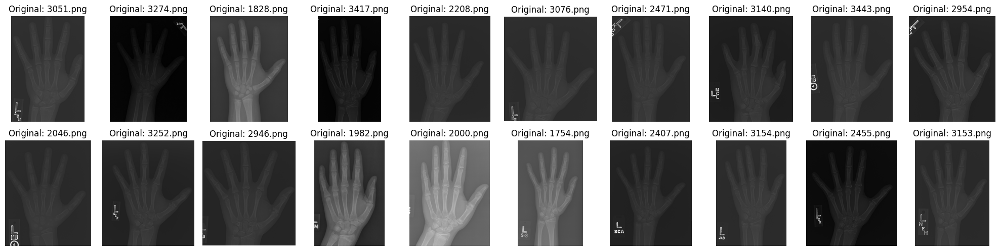

In [ ]:
#without resizing

# Define the directory where the resized images will be saved
output_dir = '/content/drive/MyDrive/FYP - Nexero/Sample/resized_images'
dataset_dir = '/content/drive/MyDrive/FYP - Nexero/Sample/Cropped'

# Remove the directory if it already exists
if os.path.exists(output_dir):
    shutil.rmtree(output_dir)

# Create the directory
os.makedirs(output_dir)

# Get list of image filenames in the dataset directory
filenames = [f for f in os.listdir(dataset_dir) if os.path.isfile(os.path.join(dataset_dir, f)) and f.endswith('.png')]

# Select a random sample of images to display and save
sample_size = 20  # Number of images to display and save
sample_images = random.sample(filenames, sample_size)

# Display original images and save them in the resized_images folder
plt.figure(figsize=(20, 10))

for i, image_filename in enumerate(sample_images, 1):
    # Read the original image
    original_image = cv2.cvtColor(cv2.imread(os.path.join(dataset_dir, image_filename)), cv2.COLOR_BGR2RGB)

    # Plot original image
    plt.subplot(4, 10, i)
    plt.imshow(original_image)
    plt.title('Original: ' + image_filename)
    plt.axis('off')

    # Save original image to the output directory
    resized_filename = os.path.join(output_dir, image_filename)
    cv2.imwrite(resized_filename, original_image)

plt.tight_layout()
plt.show()


Plot histogram to each image

In [ ]:
# Define the directory where the resized images are saved
resized_images_dir = '/content/drive/MyDrive/FYP - Nexero/Implementation/input_images'

# Function to draw and display histogram for an image
def draw_and_display_histogram(image, filename):
    # Convert image to grayscale
    gray_image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

    # Plot image and histogram
    plt.figure(figsize=(12, 6))

    # Display the original image
    plt.subplot(1, 2, 1)
    plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
    plt.title(f'Original Image: {filename}')
    plt.axis('off')

    # Display the histogram
    plt.subplot(1, 2, 2)
    plt.hist(gray_image.flatten(), bins=256, range=[0, 256], color='gray')
    plt.title('Histogram')
    plt.xlabel('Pixel Value')
    plt.ylabel('Frequency')
    plt.xlim([0, 256])

    # Show the plots
    plt.show()

# Loop through each resized image and display its histogram
for filename in os.listdir(resized_images_dir):
    # Construct the full path to the resized image
    resized_image_path = os.path.join(resized_images_dir, filename)

    # Load the resized image
    resized_image = cv2.imread(resized_image_path)

    # Check if the image was loaded successfully
    if resized_image is not None:
        # Draw and display histogram
        draw_and_display_histogram(resized_image, filename)
    else:
        print(f"Error: Unable to load the resized image {filename}.")

In [ ]:
# Define the directory where the input images are stored
output_dir = '/content/drive/MyDrive/FYP - Nexero/Implementation/input_images'

# Get list of image filenames in the output directory
filenames = [f for f in os.listdir(output_dir) if os.path.isfile(os.path.join(output_dir, f)) and f.endswith('.png')]

# Set the number of images to display (e.g., 2 for this example)
num_images_to_display = len(filenames)

# Initialize a list to store adjusted images
adjusted_images = []

def frequency_domain_filtering(image):
    # Convert to grayscale
    gray_image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

    # Perform FFT
    dft = cv2.dft(np.float32(gray_image), flags=cv2.DFT_COMPLEX_OUTPUT)
    dft_shift = np.fft.fftshift(dft)

    # Get the magnitude spectrum
    magnitude_spectrum = 20 * np.log(cv2.magnitude(dft_shift[:, :, 0], dft_shift[:, :, 1]))

    # Create a mask with high-pass filter
    rows, cols = gray_image.shape
    crow, ccol = rows // 2, cols // 2
    mask = np.zeros((rows, cols, 2), np.uint8)
    r = 90  # Radius of the high-pass filter
    center = [crow, ccol]
    x, y = np.ogrid[:rows, :cols]
    mask_area = (x - center[0]) ** 2 + (y - center[1]) ** 2 <= r*r
    mask[mask_area] = 1

    # Apply mask and inverse DFT
    fshift = dft_shift * mask
    f_ishift = np.fft.ifftshift(fshift)
    img_back = cv2.idft(f_ishift)
    img_back = cv2.magnitude(img_back[:, :, 0], img_back[:, :, 1])

    # Normalize the image
    img_back = cv2.normalize(img_back, None, 0, 255, cv2.NORM_MINMAX)

    return np.uint8(img_back)

for i, image_filename in enumerate(filenames[:num_images_to_display]):
    # Read the original image
    original_image = cv2.imread(os.path.join(output_dir, image_filename))

    # Apply frequency domain filtering for selective contrast enhancement
    adjusted_image = frequency_domain_filtering(original_image)

    # Append adjusted image and its filename as a tuple to the list
    adjusted_images.append((adjusted_image, image_filename))

    # Plot original and adjusted images side by side
    plt.figure(figsize=(10, 5))
    plt.subplot(1, 2, 1)
    plt.imshow(cv2.cvtColor(original_image, cv2.COLOR_BGR2RGB))
    plt.title('Original: ' + image_filename)
    plt.axis('off')

    plt.subplot(1, 2, 2)
    plt.imshow(adjusted_image, cmap='gray')
    plt.title('Adjusted: ' + image_filename)
    plt.axis('off')

    plt.show()


<ipython-input-3-14ffbdeefaa0>:90: RuntimeWarning: divide by zero encountered in log
  plt.imshow(20 * np.log(cv2.magnitude(filtered_frequency_domain_image[:, :, 0], filtered_frequency_domain_image[:, :, 1])), cmap='gray')


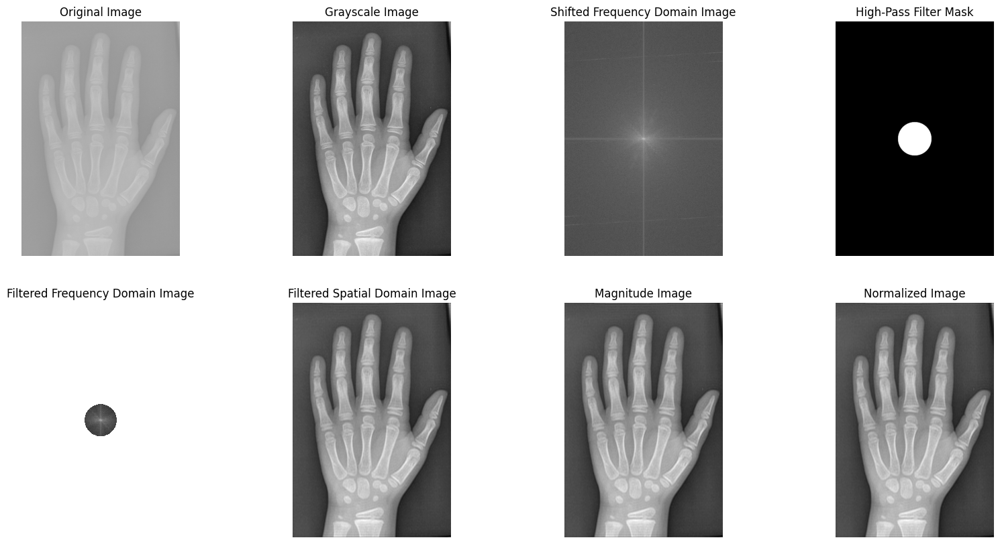

In [ ]:
import os
import cv2
import numpy as np
from matplotlib import pyplot as plt

# Define the directory where the input images are stored
output_dir = '/content/drive/MyDrive/FYP - Nexero/Implementation/input_images'

# Define the specific image to process
image_filename = '1381.png'

# Read the original image
image_path = os.path.join(output_dir, image_filename)
original_image = cv2.imread(image_path)

# Function to convert to grayscale
def convert_to_grayscale(image):
    return cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

# Function to apply FFT
def apply_fft(image):
    return cv2.dft(np.float32(image), flags=cv2.DFT_COMPLEX_OUTPUT)

# Function to shift the frequency domain representation to the center
def shift_frequency_domain(dft):
    return np.fft.fftshift(dft)

# Function to create a high-pass filter mask
def create_high_pass_filter_mask(dft_shift, radius=90):
    rows, cols = dft_shift.shape[:2]
    crow, ccol = rows // 2, cols // 2
    mask = np.zeros((rows, cols, 2), np.uint8)
    center = [crow, ccol]
    x, y = np.ogrid[:rows, :cols]
    mask_area = (x - center[0]) ** 2 + (y - center[1]) ** 2 <= radius*radius
    mask[mask_area] = 1
    return mask

# Function to apply the high-pass filter mask
def apply_high_pass_filter(dft_shift, mask):
    return dft_shift * mask

# Function to perform inverse FFT
def apply_inverse_fft(fshift):
    f_ishift = np.fft.ifftshift(fshift)
    return cv2.idft(f_ishift)

# Function to calculate magnitude
def calculate_magnitude(img_back):
    return cv2.magnitude(img_back[:, :, 0], img_back[:, :, 1])

# Function to normalize image
def normalize_image(image):
    return cv2.normalize(image, None, 0, 255, cv2.NORM_MINMAX)

# Step-by-step processing
grayscale_image = convert_to_grayscale(original_image)
frequency_domain_image = apply_fft(grayscale_image)
shifted_frequency_domain_image = shift_frequency_domain(frequency_domain_image)
high_pass_filter_mask = create_high_pass_filter_mask(shifted_frequency_domain_image)
filtered_frequency_domain_image = apply_high_pass_filter(shifted_frequency_domain_image, high_pass_filter_mask)
filtered_spatial_domain_image = apply_inverse_fft(filtered_frequency_domain_image)
magnitude_image = calculate_magnitude(filtered_spatial_domain_image)
normalized_image = normalize_image(magnitude_image)

# Display results at each step
plt.figure(figsize=(20, 10))

plt.subplot(2, 4, 1)
plt.imshow(cv2.cvtColor(original_image, cv2.COLOR_BGR2RGB))
plt.title('Original Image')
plt.axis('off')

plt.subplot(2, 4, 2)
plt.imshow(grayscale_image, cmap='gray')
plt.title('Grayscale Image')
plt.axis('off')

plt.subplot(2, 4, 3)
plt.imshow(20 * np.log(cv2.magnitude(shifted_frequency_domain_image[:, :, 0], shifted_frequency_domain_image[:, :, 1])), cmap='gray')
plt.title('Shifted Frequency Domain Image')
plt.axis('off')

plt.subplot(2, 4, 4)
plt.imshow(high_pass_filter_mask[:, :, 0], cmap='gray')
plt.title('High-Pass Filter Mask')
plt.axis('off')

plt.subplot(2, 4, 5)
plt.imshow(20 * np.log(cv2.magnitude(filtered_frequency_domain_image[:, :, 0], filtered_frequency_domain_image[:, :, 1])), cmap='gray')
plt.title('Filtered Frequency Domain Image')
plt.axis('off')

plt.subplot(2, 4, 6)
plt.imshow(cv2.magnitude(filtered_spatial_domain_image[:, :, 0], filtered_spatial_domain_image[:, :, 1]), cmap='gray')
plt.title('Filtered Spatial Domain Image')
plt.axis('off')

plt.subplot(2, 4, 7)
plt.imshow(magnitude_image, cmap='gray')
plt.title('Magnitude Image')
plt.axis('off')

plt.subplot(2, 4, 8)
plt.imshow(normalized_image, cmap='gray')
plt.title('Normalized Image')
plt.axis('off')

plt.show()


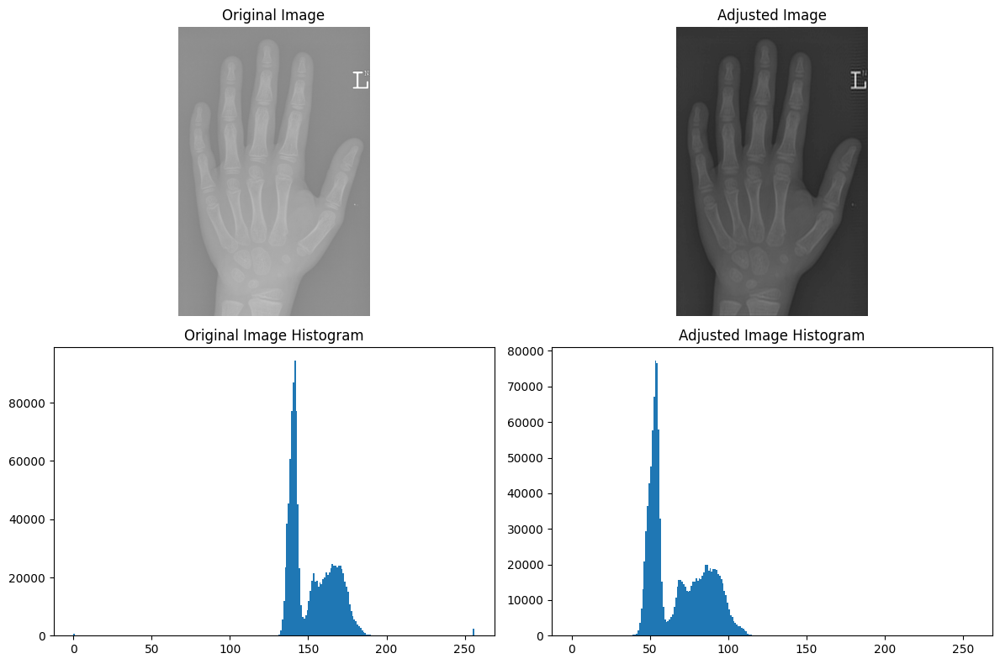

In [ ]:
import cv2
import matplotlib.pyplot as plt
import os

# Define the paths
original_images_path = '/content/drive/MyDrive/FYP - Nexero/Implementation/input_images'
image_filename = '1394.png'

# Load the original image
original_image = cv2.imread(os.path.join(original_images_path, image_filename), cv2.IMREAD_GRAYSCALE)

# Find the adjusted image from the array
adjusted_image = None
for img, fname in adjusted_images:
    if fname == image_filename:
        adjusted_image = img
        break

# Check if the adjusted image is found
if adjusted_image is None:
    raise ValueError(f"Adjusted image with filename {image_filename} not found in the array.")

# Function to plot histogram
def plot_histogram(image, ax, title):
    ax.hist(image.ravel(), bins=256, range=(0, 256))
    ax.set_title(title)

# Plot the images and their histograms
fig, axes = plt.subplots(2, 2, figsize=(12, 8))

# Display the original image and its histogram
axes[0, 0].imshow(original_image, cmap='gray')
axes[0, 0].set_title('Original Image')
axes[0, 0].axis('off')
plot_histogram(original_image, axes[1, 0], 'Original Image Histogram')

# Display the adjusted image and its histogram
axes[0, 1].imshow(adjusted_image, cmap='gray')
axes[0, 1].set_title('Adjusted Image')
axes[0, 1].axis('off')
plot_histogram(adjusted_image, axes[1, 1], 'Adjusted Image Histogram')

# Adjust layout
plt.tight_layout()
plt.show()


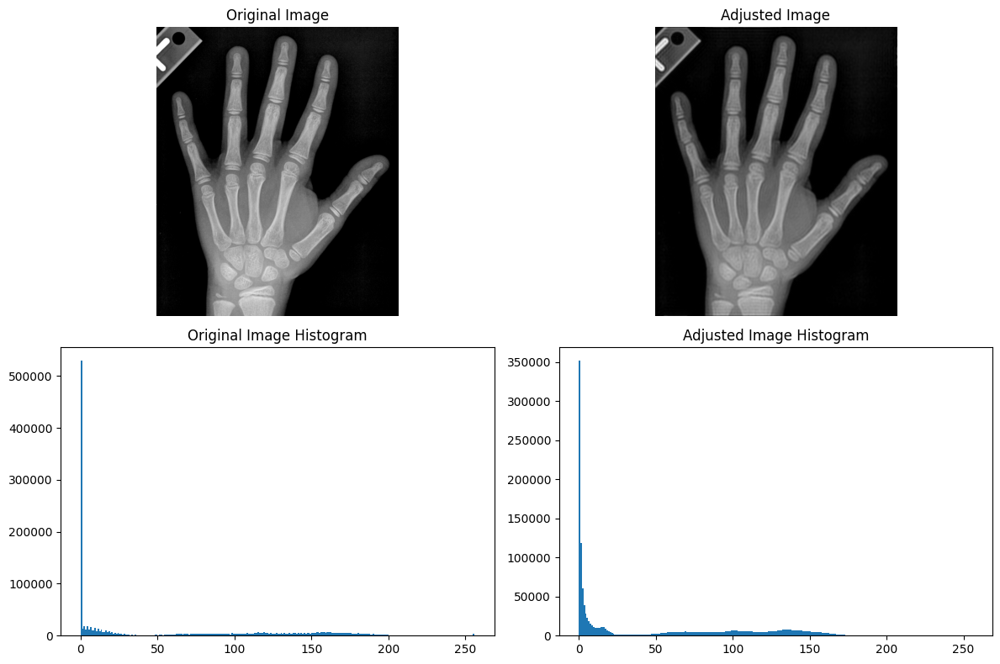

In [ ]:
import cv2
import matplotlib.pyplot as plt
import os

# Define the paths
original_images_path = '/content/drive/MyDrive/FYP - Nexero/Implementation/input_images'
image_filename = '1588.png'

# Load the original image
original_image = cv2.imread(os.path.join(original_images_path, image_filename), cv2.IMREAD_GRAYSCALE)

# Find the adjusted image from the array
adjusted_image = None
for img, fname in adjusted_images:
    if fname == image_filename:
        adjusted_image = img
        break

# Check if the adjusted image is found
if adjusted_image is None:
    raise ValueError(f"Adjusted image with filename {image_filename} not found in the array.")

# Function to plot histogram
def plot_histogram(image, ax, title):
    ax.hist(image.ravel(), bins=256, range=(0, 256))
    ax.set_title(title)

# Plot the images and their histograms
fig, axes = plt.subplots(2, 2, figsize=(12, 8))

# Display the original image and its histogram
axes[0, 0].imshow(original_image, cmap='gray')
axes[0, 0].set_title('Original Image')
axes[0, 0].axis('off')
plot_histogram(original_image, axes[1, 0], 'Original Image Histogram')

# Display the adjusted image and its histogram
axes[0, 1].imshow(adjusted_image, cmap='gray')
axes[0, 1].set_title('Adjusted Image')
axes[0, 1].axis('off')
plot_histogram(adjusted_image, axes[1, 1], 'Adjusted Image Histogram')

# Adjust layout
plt.tight_layout()
plt.show()


CLAHE - > Bilateral

In [ ]:
# Ensure adjusted_images list contains tuples of (image, filename)
adjusted_images = [(adjusted_image, filename) for adjusted_image, filename in adjusted_images]

# Initialize a list to store equalized_images
equalized_images = []

# Display original images, final equalized images, and their histograms
num_images = len(adjusted_images)
num_rows = (num_images + 4) // 5  # Calculate the number of rows required

# Create subplots with appropriate size
fig, axes = plt.subplots(num_rows, 5, figsize=(20, 4 * num_rows))

for i in range(num_rows):
    for j in range(5):
        idx = i * 5 + j
        if idx < num_images:
            # Retrieve adjusted image and filename
            adjusted_image, image_filename = adjusted_images[idx]

            # Check if the adjusted image has more than one channel
            if len(adjusted_image.shape) == 3:
                # Convert adjusted image to grayscale
                gray_adjusted_image = cv2.cvtColor(adjusted_image, cv2.COLOR_BGR2GRAY)
            else:
                gray_adjusted_image = adjusted_image

            # Create a CLAHE object (Contrast Limited Adaptive Histogram Equalization)
            clahe = cv2.createCLAHE(clipLimit=2, tileGridSize=(3, 3))

            # Apply CLAHE
            clahe_equalized_image = clahe.apply(gray_adjusted_image)

            # Apply Bilateral Filter after CLAHE
            equalized_image = cv2.bilateralFilter(clahe_equalized_image, d=9, sigmaColor=75, sigmaSpace=75)

            # Append equalized_images to the list
            equalized_images.append((equalized_image, image_filename))

            # Plot final equalized image
            axes[i, j].imshow(equalized_image, cmap='gray')
            axes[i, j].set_title(image_filename)
            axes[i, j].axis('off')

# Adjust layout
plt.tight_layout()
plt.show()


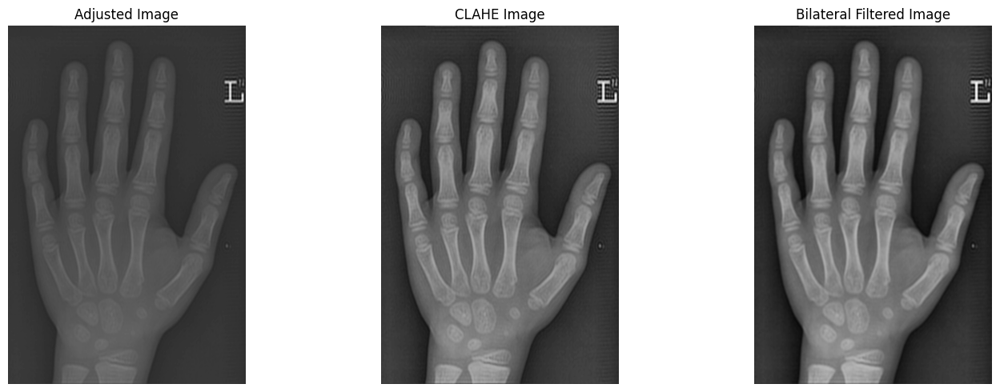

In [ ]:
import cv2
import matplotlib.pyplot as plt

# Ensure adjusted_images list contains tuples of (image, filename)
adjusted_images = [(adjusted_image, filename) for adjusted_image, filename in adjusted_images]

# Initialize a variable to store the specific image and filename
target_image = None
target_filename = '1394.png'

# Find and process the target image
for adjusted_image, filename in adjusted_images:
    if filename == target_filename:
        target_image = adjusted_image
        break

if target_image is not None:
    # Check if the adjusted image has more than one channel
    if len(target_image.shape) == 3:
        # Convert adjusted image to grayscale
        gray_adjusted_image = cv2.cvtColor(target_image, cv2.COLOR_BGR2GRAY)
    else:
        gray_adjusted_image = target_image

    # Create a CLAHE object (Contrast Limited Adaptive Histogram Equalization)
    clahe = cv2.createCLAHE(clipLimit=2, tileGridSize=(3, 3))

    # Apply CLAHE
    clahe_equalized_image = clahe.apply(gray_adjusted_image)

    # Apply Bilateral Filter after CLAHE
    bilateral_image = cv2.bilateralFilter(clahe_equalized_image, d=9, sigmaColor=75, sigmaSpace=75)

    # Plot the images
    fig, axes = plt.subplots(1, 3, figsize=(15, 5))

    axes[0].imshow(gray_adjusted_image, cmap='gray')
    axes[0].set_title('Adjusted Image')
    axes[0].axis('off')

    axes[1].imshow(clahe_equalized_image, cmap='gray')
    axes[1].set_title('CLAHE Image')
    axes[1].axis('off')

    axes[2].imshow(bilateral_image, cmap='gray')
    axes[2].set_title('Bilateral Filtered Image')
    axes[2].axis('off')

    plt.tight_layout()
    plt.show()
else:
    print(f'Image {target_filename} not found in adjusted_images.')


# Binarization (without saving in drive )

In [ ]:
# Ensure equalized_images list contains tuples of (image, filename)
equalized_images = [(equalized_image, filename) for equalized_image, filename in equalized_images]

# Initialize a list to store binary thresholded images
binary_threshold_images = []

# Apply binary thresholding to each image in equalized_images
for equalized_image, filename in equalized_images:
    _, binary_image = cv2.threshold(equalized_image,70, 250, cv2.THRESH_BINARY)
    binary_threshold_images.append((binary_image, filename))

# Define the output directory
output_dir = '/content/drive/MyDrive/FYP - Nexero/Implementation/binarized_images'

# Ensure the output directory exists
os.makedirs(output_dir, exist_ok=True)

# Save binary thresholded images to the output directory
for binary_image, filename in binary_threshold_images:
    output_path = os.path.join(output_dir, filename)
    cv2.imwrite(output_path, binary_image)

# Display the binary thresholded images
num_images = len(binary_threshold_images)
num_rows = (num_images + 4) // 5  # Calculate the number of rows required

fig, axes = plt.subplots(num_rows, 5, figsize=(20, 4 * num_rows))

for i in range(num_rows):
    for j in range(5):
        idx = i * 5 + j
        if idx < num_images:
            binary_threshold_image, filename = binary_threshold_images[idx]
            axes[i, j].imshow(binary_threshold_image, cmap='gray')
            axes[i, j].set_title(filename)
            axes[i, j].axis('off')

plt.tight_layout()
plt.show()

# mask generation

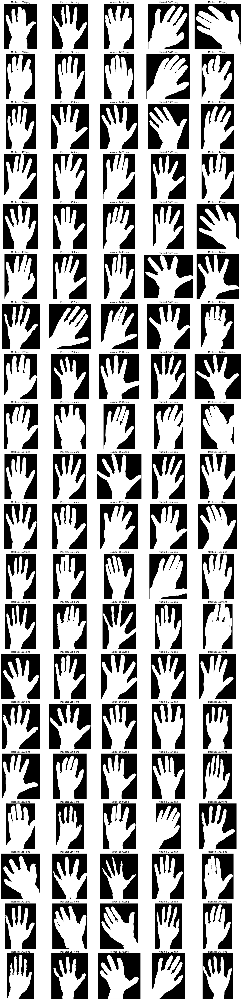

In [ ]:
# Define the directory containing the binarized images
binarized_images_dir = '/content/drive/MyDrive/FYP - Nexero/Implementation/binarized_images'

# Read the binary images and their filenames from the directory
binary_threshold_images = []
for filename in os.listdir(binarized_images_dir):
    if filename.endswith(".png") or filename.endswith(".jpg"):
        image_path = os.path.join(binarized_images_dir, filename)
        binary_image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)
        binary_threshold_images.append((binary_image, filename))

# Initialize a list to store the segmented masks
mask_images = []

# Define a function to segment the largest component and create a mask
def segment_largest_component(binary_image):
    # Find all connected components (8-connectivity)
    num_labels, labels_im = cv2.connectedComponents(binary_image)

    # Find the largest component (excluding background)
    max_label = 1
    max_size = 0
    for label in range(1, num_labels):
        size = np.sum(labels_im == label)
        if size > max_size:
            max_size = size
            max_label = label

    # Create a mask for the largest component
    mask = (labels_im == max_label).astype(np.uint8) * 255

    # Check if the mask is connected to the border
    if (mask[0, :].any() or mask[-1, :].any() or mask[:, 0].any() or mask[:, -1].any()):
        # Remove a two-pixel border from the edges of the mask
        mask[0:2, :] = 0
        mask[-2:, :] = 0
        mask[:, 0:2] = 0
        mask[:, -2:] = 0

    return mask

# Populate mask_images with segmented masks and filenames
for binary_image, filename in binary_threshold_images:
    segmented_mask = segment_largest_component(binary_image)
    mask_images.append((segmented_mask, filename))

# Display masked images
num_images = len(mask_images)
num_rows = (num_images + 4) // 5  # Calculate the number of rows required (round up to handle all images)

fig, axes = plt.subplots(num_rows, 5, figsize=(20, 4 * num_rows))

for i in range(num_rows):
    for j in range(5):
        idx = i * 5 + j
        if idx < num_images:
            segmented_mask, image_filename = mask_images[idx]

            # Plot segmented mask
            axes[i, j].imshow(segmented_mask, cmap='gray')
            axes[i, j].set_title('Masked: ' + image_filename)
            axes[i, j].axis('off')

plt.tight_layout()
plt.show()

# Contour detection and convex hull detection

# Convexity defect detection

1.   contour
2.   convexhull
3.   convexity defect
4.   mark finger tips





Filename: 1398.png
Finger points: [(436, 136), (330, 62), (278, 81), (152, 137), (31, 233), (94, 928), (482, 928), (658, 391)]
Filename: 1441.png
Finger points: [(637, 87), (402, 25), (310, 89), (29, 362), (262, 1214), (950, 520)]
Filename: 1411.png
Finger points: [(653, 342), (565, 108), (377, 44), (165, 108), (97, 147), (25, 278), (100, 1064)]
Filename: 1407.png
Finger points: [(752, 181), (654, 55), (464, 33), (180, 97), (676, 682)]
Filename: 1402.png
Finger points: [(318, 37), (79, 150), (51, 233), (34, 308), (80, 494), (513, 845), (746, 112)]
Filename: 1378.png
Finger points: [(456, 120), (278, 9), (161, 46), (109, 82), (22, 230), (40, 843), (483, 544)]
Filename: 1381.png
Finger points: [(583, 117), (444, 55), (218, 168), (94, 317), (830, 497)]
Filename: 1422.png
Finger points: [(403, 61), (269, 28), (155, 125), (28, 265), (626, 351)]
Filename: 1418.png
Finger points: [(653, 218), (608, 72), (509, 32), (428, 46), (261, 102), (667, 497)]
Filename: 1399.png
Finger points: [(600, 389

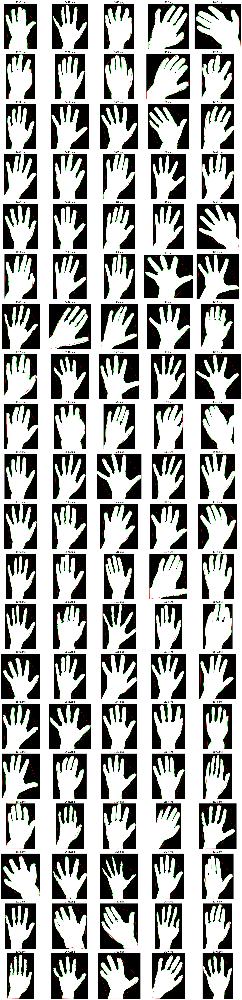

In [ ]:
mask_images = [(segmented_mask, filename) for segmented_mask, filename in mask_images]

convex_hull_images = []
fingertips = []
finger_points = []

# Function to calculate the angle
def calculate_angle(pt1, pt2, pt0):
    vec1 = pt1 - pt0
    vec2 = pt2 - pt0
    cosine_angle = np.dot(vec1, vec2) / (np.linalg.norm(vec1) * np.linalg.norm(vec2))
    angle = np.arccos(np.clip(cosine_angle, -1.0, 1.0))
    return np.degrees(angle)

# Iterate through each mask image
for segmented_mask, filename in mask_images:
    # Clear finger_points list for each image
    finger_points = []

    # Ensure the mask is binary
    segmented_mask = (segmented_mask > 0).astype(np.uint8)

    # Apply dilation to eliminate self-intersections
    kernel = np.ones((3, 3), np.uint8)
    segmented_mask = cv2.dilate(segmented_mask, kernel, iterations=1)

    # Find contours
    contours, _ = cv2.findContours(segmented_mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

    # Create a blank RGB image
    mask_rgb = cv2.cvtColor(segmented_mask * 255, cv2.COLOR_GRAY2RGB)

    # Draw contours in green
    cv2.drawContours(mask_rgb, contours, -1, (0, 255, 0), 2)

    # Find convex hull for each contour
    for contour in contours:
      # Convex hull and defects make sense only if there are at least 3 points
        if len(contour) >= 3:
            # Approximate the contour to simplify it
            epsilon = 0.01 * cv2.arcLength(contour, True)
            approx_contour = cv2.approxPolyDP(contour, epsilon, True)

            hull = cv2.convexHull(approx_contour, returnPoints=False)

            # Draw convex hull in blue
            hull_points = cv2.convexHull(approx_contour)
            cv2.drawContours(mask_rgb, [hull_points], -1, (255, 0, 0), 2)

            # Find convexity defects
            if len(hull) > 2:
                defects = cv2.convexityDefects(approx_contour, hull)

                if defects is not None:
                    for i in range(defects.shape[0]):
                        s, e, f, d = defects[i, 0]
                        start = tuple(approx_contour[s][0])
                        end = tuple(approx_contour[e][0])
                        far = tuple(approx_contour[f][0])

                        # Only store unique start and end points
                        if start not in finger_points:
                            finger_points.append(start)
                        if end not in finger_points:
                            finger_points.append(end)

                        # Calculate angle at defect point
                        a = np.linalg.norm(np.array(start) - np.array(end))
                        b = np.linalg.norm(np.array(start) - np.array(far))
                        c = np.linalg.norm(np.array(end) - np.array(far))

                        angle = np.degrees(np.arccos((b**2 + c**2 - a**2) / (2 * b * c)))

                        # Mark defect if the angle is less than 90 degrees
                        if angle < 90.0:
                            cv2.circle(mask_rgb, far, 5, (0, 0, 255), -1)
                            cv2.circle(mask_rgb, start, 5, (0, 255, 255), -1)
                            cv2.circle(mask_rgb, end, 5, (0, 255, 255), -1)

    convex_hull_images.append((mask_rgb, filename))
    fingertips.append({"filename": filename, "finger_points": finger_points})

    print(f"Filename: {filename}")
    print("Finger points:", finger_points)

# Display images in a grid format if there are any images to display
num_images = len(convex_hull_images)
if num_images > 0:
    num_columns = 5
    num_rows = (num_images + num_columns - 1) // num_columns

    fig, axes = plt.subplots(num_rows, num_columns, figsize=(20, 4 * num_rows))
    axes = axes.flatten()

    for i, (convex_hull_image, filename) in enumerate(convex_hull_images):
        axes[i].imshow(convex_hull_image)
        axes[i].set_title(filename)
        axes[i].axis('off')

    # Hide any remaining axes if the number of images is less than num_rows * num_columns
    for i in range(num_images, num_rows * num_columns):
        axes[i].axis('off')

    plt.tight_layout()
    plt.show()
else:
    print("No images to display.")

# Palm circle detection

In [ ]:
palm_middle_point = []

def load_image(filename):
    # Load the image using OpenCV
    image = cv2.imread(filename)
    if image is None:
        print(f"Error: Unable to load image '{filename}'")
    return image

def mark_finger_points(image, finger_points, palm_center):
    if len(finger_points) == 0:
        print("Error: No finger points found.")
        return image, None

    num_points = len(finger_points)
    if num_points % 2 == 0:  # If even number of points
        middle_point = np.mean(finger_points, axis=0).astype(int)
    else:  # If odd number of points
        middle_point_index = num_points // 2
        middle_point = finger_points[middle_point_index]

    for far_point in finger_points:
        cv2.circle(image, tuple(far_point), 5, (0, 0, 255), -1)  # Mark far point with a red circle
    cv2.circle(image, tuple(middle_point), 5, (0, 255, 0), -1)  # Mark middle point with a green circle

    return image, middle_point

# Function to detect the largest inscribed circle within the hand contour and mark its center
def detect_palm_circle(image):
    gray = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)
    _, thresh = cv2.threshold(gray, 1, 255, cv2.THRESH_BINARY)
    contours, _ = cv2.findContours(thresh, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    max_contour = max(contours, key=cv2.contourArea)

    # Find the largest inscribed circle
    dist_transform = cv2.distanceTransform(thresh, cv2.DIST_L2, 5)
    min_val, max_val, min_loc, max_loc = cv2.minMaxLoc(dist_transform)

    # Draw the largest inscribed circle and its center
    result_image = image.copy()
    cv2.circle(result_image, max_loc, int(max_val), (0, 255, 0), 2)  # Draw the circle
    cv2.circle(result_image, max_loc, 5, (255, 0, 0), -1)  # Draw the center as a small dot
    palm_middle_point.append({"filename": filename, "middle_point": max_loc})
    print(f"Filename: {filename}")
    print("middle_point:", max_loc)

    return result_image, max_loc, int(max_val)

# List to store the resulting images, contours, and filenames
palm_circle_images = []

# Process each image in the convex_hull_images array
for mask_rgb, filename in convex_hull_images:
    result_image, center, radius = detect_palm_circle(mask_rgb)
    gray = cv2.cvtColor(result_image, cv2.COLOR_RGB2GRAY)
    _, thresh = cv2.threshold(gray, 1, 255, cv2.THRESH_BINARY)
    contours, _ = cv2.findContours(thresh, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    finger_points = [tuple(contour[0][0]) for contour in contours]
    result_image, middle_point = mark_finger_points(result_image, finger_points, center)
    palm_circle_images.append((result_image, contours, filename))

# Display images in a grid format
num_images = len(palm_circle_images)
num_columns = 5
num_rows = (num_images + num_columns - 1) // num_columns

fig, axes = plt.subplots(num_rows, num_columns, figsize=(20, 4 * num_rows))
axes = axes.flatten()

for i, (palm_circle_image, _, filename) in enumerate(palm_circle_images):
    axes[i].imshow(palm_circle_image)
    axes[i].set_title(filename)
    axes[i].axis('off')

# Hide any remaining axes if the number of images is less than num_rows * num_columns
for i in range(num_images, num_rows * num_columns):
    axes[i].axis('off')

plt.tight_layout()
plt.show()


# Hand region segmentation

In [ ]:
mask_images = [(segmented_mask, filename) for segmented_mask, filename in mask_images]

original_dir = '/content/drive/MyDrive/FYP - Nexero/Implementation/input_images'
output_dir = '/content/drive/MyDrive/FYP - Nexero/Implementation/segmented_hand'

segmented_hand_region = []

# Get list of filenames
original_filenames = [f for f in os.listdir(original_dir) if os.path.isfile(os.path.join(original_dir, f)) and f.endswith('.png')]

# Create a directory to store final segmented images
if os.path.exists(output_dir):
    shutil.rmtree(output_dir)
os.makedirs(output_dir)

# Function to apply the mask to the original image
def apply_mask(original_image, mask):
    # Ensure the mask is binary
    mask = mask // 255
    # Apply mask to original image
    segmented_image = original_image * np.dstack([mask, mask, mask])
    return segmented_image

# Create a dictionary for quick access to masks by filename
mask_dict = {filename: mask for mask, filename in mask_images}

# Process and display segmented images
for image_filename in original_filenames:
    # Read the original image
    original_image_path = os.path.join(original_dir, image_filename)
    original_image = cv2.imread(original_image_path)

    if original_image is None:
        print(f"Error reading the original image: {original_image_path}")
        continue

    # Read the segmented mask
    if image_filename not in mask_dict:
        print(f"Mask for {image_filename} not found.")
        continue

    mask = mask_dict[image_filename]

    # Ensure mask and original image have the same dimensions
    if original_image.shape[:2] != mask.shape[:2]:
        print(f"Dimension mismatch between original image and mask for file: {image_filename}")
        continue

    # Apply the mask to the original image
    hand_region_image = apply_mask(original_image, mask)

    segmented_hand_region.append((hand_region_image, image_filename))

    # Save segmented image to the output directory
    output_filename = os.path.join(output_dir, image_filename)
    cv2.imwrite(output_filename, hand_region_image)

# Display segmented images
num_images = len(segmented_hand_region)
num_rows = (num_images + 4) // 5  # Calculate the number of rows required (round up to handle all images)

fig, axes = plt.subplots(num_rows, 5, figsize=(20, 4 * num_rows))

for i in range(num_rows):
    for j in range(5):
        idx = i * 5 + j
        if idx < num_images:
            hand_region_image, image_filename = segmented_hand_region[idx]

            # Plot segmented image
            axes[i, j].imshow(cv2.cvtColor(hand_region_image, cv2.COLOR_BGR2RGB))
            axes[i, j].set_title('Segmented: ' + image_filename)
            axes[i, j].axis('off')

plt.tight_layout()
plt.show()

Mark finger tips and palm center on segmented images

In [ ]:
# Directory containing segmented images
segmented_dir = '/content/drive/MyDrive/FYP - Nexero/Implementation/segmented_hand'

# Get list of filenames
segmented_filenames = [f for f in os.listdir(segmented_dir) if os.path.isfile(os.path.join(segmented_dir, f)) and f.endswith('.png')]

# List to store loaded images along with filenames
segmented_hand_region = []

# Load segmented images
for filename in segmented_filenames:
    image_path = os.path.join(segmented_dir, filename)
    image = cv2.imread(image_path)
    segmented_hand_region.append((image, filename))

# Function to find fingertip points for a given filename
def find_finger_points(filename, points_list):
    for item in points_list:
        if item["filename"] == filename:
            return item["finger_points"]
    return None

# Function to find middle point for a given filename
def find_middle_point(filename, points_list):
    for item in points_list:
        if item["filename"] == filename:
            return item["middle_point"]
    return None

# Display segmented images
num_images = len(segmented_hand_region)
num_rows = (num_images + 4) // 5  # Calculate the number of rows required (round up to handle all images)

fig, axes = plt.subplots(num_rows, 5, figsize=(20, 4 * num_rows))

for i in range(num_rows):
    for j in range(5):
        idx = i * 5 + j
        if idx < num_images:
            hand_region_image, image_filename = segmented_hand_region[idx]

            # Find finger points and palm middle point for this image
            finger_points = find_finger_points(image_filename, fingertips)
            middle_point = find_middle_point(image_filename, palm_middle_point)

            # Mark points on the image
            if finger_points:
                for point in finger_points:
                    cv2.circle(hand_region_image, point, 5, (0, 255, 0), -1)  # Green circles for finger points
            if middle_point:
                cv2.circle(hand_region_image, middle_point, 5, (255, 0, 0), -1)  # Red circle for palm middle point

            # Plot segmented image
            axes[i, j].imshow(cv2.cvtColor(hand_region_image, cv2.COLOR_BGR2RGB))
            axes[i, j].set_title('Segmented: ' + image_filename)
            axes[i, j].axis('off')

plt.tight_layout()
plt.show()

In [ ]:
# Directory containing segmented images
segmented_dir = '/content/drive/MyDrive/FYP - Nexero/Implementation/segmented_hand'

# Get list of filenames
segmented_filenames = [f for f in os.listdir(segmented_dir) if os.path.isfile(os.path.join(segmented_dir, f)) and f.endswith('.png')]

# List to store loaded images along with filenames
segmented_hand_region = []

# Load segmented images
for filename in segmented_filenames:
    image_path = os.path.join(segmented_dir, filename)
    image = cv2.imread(image_path)
    segmented_hand_region.append((image, filename))

# Function to find fingertip points for a given filename
def find_finger_points(filename, points_list):
    for item in points_list:
        if item["filename"] == filename:
            return item["finger_points"]
    return None

# Function to find middle point for a given filename
def find_middle_point(filename, points_list):
    for item in points_list:
        if item["filename"] == filename:
            return item["middle_point"]
    return None

# Display segmented images
num_images = len(segmented_hand_region)
num_rows = (num_images + 4) // 5  # Calculate the number of rows required (round up to handle all images)

fig, axes = plt.subplots(num_rows, 5, figsize=(20, 4 * num_rows))

for i in range(num_rows):
    for j in range(5):
        idx = i * 5 + j
        if idx < num_images:
            hand_region_image, image_filename = segmented_hand_region[idx]

            # Find finger points and palm middle point for this image
            finger_points = find_finger_points(image_filename, fingertips)
            middle_point = find_middle_point(image_filename, palm_middle_point)

            # Adjust finger points by removing outliers in y-coordinate
            if finger_points:
                # Extract y-coordinates
                y_coordinates = [point[1] for point in finger_points]
                # Calculate median of y-coordinates
                y_median = np.median(y_coordinates)
                # Calculate absolute difference from median
                y_diff = np.abs(np.array(y_coordinates) - y_median)
                # Define threshold for outlier removal (e.g., 500)
                y_threshold = 500
                # Remove points with y-values exceeding the threshold
                adjusted_finger_points = [finger_points[i] for i in range(len(finger_points)) if y_diff[i] < y_threshold]

                # Sort adjusted finger points by x-coordinate in descending order
                sorted_finger_points = sorted(adjusted_finger_points, key=lambda point: point[0], reverse=True)

                # Calculate index of the middle finger point
                middle_index = len(sorted_finger_points) // 2
                if len(sorted_finger_points) % 2 == 0:  # Even number of points
                    middle_index -= 1

                # Get the middle finger point
                middle_finger_point = sorted_finger_points[middle_index]

                # Draw the middle finger point
                cv2.circle(hand_region_image, middle_finger_point, 5, (0, 0, 255), -1)  # Blue circle for middle finger point

                # Draw lines from the middle finger point to the palm center point
                if middle_point:
                    cv2.line(hand_region_image, middle_finger_point, middle_point, (0, 255, 255), 2)  # Yellow line

                # Draw all finger points
                for point in adjusted_finger_points:
                    cv2.circle(hand_region_image, point, 5, (0, 255, 0), -1)  # Green circles for finger points

            if middle_point:
                cv2.circle(hand_region_image, middle_point, 5, (255, 0, 0), -1)  # Red circle for palm middle point

            # Plot segmented image
            axes[i, j].imshow(cv2.cvtColor(hand_region_image, cv2.COLOR_BGR2RGB))
            axes[i, j].set_title('Segmented: ' + image_filename)
            axes[i, j].axis('off')

plt.tight_layout()
plt.show()


In [ ]:
# Directory containing segmented images
segmented_dir = '/content/drive/MyDrive/FYP - Nexero/Implementation/segmented_hand'

# Get list of filenames
segmented_filenames = [f for f in os.listdir(segmented_dir) if os.path.isfile(os.path.join(segmented_dir, f)) and f.endswith('.png')]

# List to store loaded images along with filenames
segmented_hand_region = []

# Load segmented images
for filename in segmented_filenames:
    image_path = os.path.join(segmented_dir, filename)
    image = cv2.imread(image_path)
    segmented_hand_region.append((image, filename))

# Function to find fingertip points for a given filename
def find_finger_points(filename, points_list):
    for item in points_list:
        if item["filename"] == filename:
            return item["finger_points"]
    return None

# Function to find middle point for a given filename
def find_middle_point(filename, points_list):
    for item in points_list:
        if item["filename"] == filename:
            return item["middle_point"]
    return None

# Display segmented images
num_images = len(segmented_hand_region)
num_rows = (num_images + 4) // 5  # Calculate the number of rows required (round up to handle all images)

fig, axes = plt.subplots(num_rows, 5, figsize=(20, 4 * num_rows))

for i in range(num_rows):
    for j in range(5):
        idx = i * 5 + j
        if idx < num_images:
            hand_region_image, image_filename = segmented_hand_region[idx]
            # Find finger points and palm middle point for this image
            finger_points = find_finger_points(image_filename, fingertips)
            middle_point = find_middle_point(image_filename, palm_middle_point)
            # Adjust finger points by removing outliers in y-coordinate
            if finger_points:
                y_coordinates = [point[1] for point in finger_points]  # Extract y-coordinates
                y_median = np.median(y_coordinates)   # Calculate median of y-coordinates
                y_diff = np.abs(np.array(y_coordinates) - y_median)  # Calculate absolute difference from median
                y_threshold = 500  # Define threshold for outlier removal
                # Remove points with y-values exceeding the threshold
                adjusted_finger_points = [finger_points[i] for i in range(len(finger_points)) if y_diff[i] < y_threshold]
                # Sort adjusted finger points by x-coordinate in descending order
                sorted_finger_points = sorted(adjusted_finger_points, key=lambda point: point[0], reverse=True)
                middle_index = len(sorted_finger_points) // 2 # Calculate index of the middle finger point
                if len(sorted_finger_points) % 2 == 0:  # Even number of points
                    middle_index -= 1
                middle_finger_point = sorted_finger_points[middle_index]  # Get the middle finger point
                cv2.circle(hand_region_image, middle_finger_point, 5, (0, 0, 255), -1)  # Draw the Blue circle for middle finger point
                # Draw lines from the middle finger point to the palm center point
                if middle_point:
                    cv2.line(hand_region_image, middle_finger_point, middle_point, (0, 255, 255), 2)
                    # Yellow line
                # Draw all finger points
                for point in adjusted_finger_points:
                    cv2.circle(hand_region_image, point, 5, (0, 255, 0), -1)
                    # Green circles for finger points
            if middle_point:
                cv2.circle(hand_region_image, middle_point, 5, (255, 0, 0), -1)
                # Red circle for palm middle point
                # Draw a vertical line through the palm center
                height = hand_region_image.shape[0]
                cv2.line(hand_region_image, (middle_point[0], 0), (middle_point[0], height), (255, 0, 255), 2)
                 # Pink/cyan line

            # Plot segmented image
            axes[i, j].imshow(cv2.cvtColor(hand_region_image, cv2.COLOR_BGR2RGB))
            axes[i, j].set_title('Segmented: ' + image_filename)
            axes[i, j].axis('off')

plt.tight_layout()
plt.show()

In [ ]:
# Directory containing segmented images
segmented_dir = '/content/drive/MyDrive/FYP - Nexero/Implementation/segmented_hand'
# Directory to store rotated images
output_dir = '/content/drive/MyDrive/FYP - Nexero/Implementation/rotated_images'

# Ensure the output directory exists or recreate it
if os.path.exists(output_dir):
    shutil.rmtree(output_dir)  # Remove existing directory and its contents
os.makedirs(output_dir)  # Recreate the directory

# Get list of filenames
segmented_filenames = [f for f in os.listdir(segmented_dir) if os.path.isfile(os.path.join(segmented_dir, f)) and f.endswith('.png')]

# List to store loaded images along with filenames
segmented_hand_region = []

# Load segmented images
for filename in segmented_filenames:
    image_path = os.path.join(segmented_dir, filename)
    image = cv2.imread(image_path)
    segmented_hand_region.append((image, filename))

# Function to find fingertip points for a given filename
def find_finger_points(filename, points_list):
    for item in points_list:
        if item["filename"] == filename:
            return item["finger_points"]
    return None

# Function to find middle point for a given filename
def find_middle_point(filename, points_list):
    for item in points_list:
        if item["filename"] == filename:
            return item["middle_point"]
    return None

# Function to rotate and center the image, resizing canvas if necessary
def rotate_and_center_image(image, angle, center):
    # Perform the rotation
    rotated = cv2.warpAffine(image, cv2.getRotationMatrix2D(center, angle, 1.0), (image.shape[1], image.shape[0]))

    # Find minimum enclosing box (contour)
    mask = cv2.inRange(rotated, (0, 0, 0), (255, 255, 255))  # Convert to binary mask
    contours, _ = cv2.findContours(mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    x, y, w, h = cv2.boundingRect(contours[0])  # Get bounding rectangle coordinates

    # Add padding to the bounding box (optional)
    padding = 10
    x -= padding
    y -= padding
    w += 2 * padding
    h += 2 * padding

    # Ensure coordinates are within image bounds
    x = max(0, x)
    y = max(0, y)
    w = min(w, image.shape[1])
    h = min(h, image.shape[0])

    # Calculate translation to center within the new bounding box
    dx = (w - rotated.shape[1]) // 2
    dy = (h - rotated.shape[0]) // 2

    # Translate the image
    M = np.float32([[1, 0, dx], [0, 1, dy]])
    translated = cv2.warpAffine(rotated, M, (w, h))
    return translated

# Display segmented images
num_images = len(segmented_hand_region)
num_rows = (num_images + 4) // 5  # Calculate the number of rows required (round up to handle all images)

fig, axes = plt.subplots(num_rows, 5, figsize=(20, 4 * num_rows))

for i in range(num_rows):
    for j in range(5):
        idx = i * 5 + j
        if idx < num_images:
            hand_region_image, image_filename = segmented_hand_region[idx]

            # Create a copy of the image for saving
            save_image = hand_region_image.copy()

            # Find finger points and palm middle point for this image
            finger_points = find_finger_points(image_filename, fingertips)
            middle_point = find_middle_point(image_filename, palm_middle_point)

            # Adjust finger points by removing outliers in y-coordinate
            if finger_points:
                # Extract y-coordinates
                y_coordinates = [point[1] for point in finger_points]
                # Calculate median of y-coordinates
                y_median = np.median(y_coordinates)
                # Calculate absolute difference from median
                y_diff = np.abs(np.array(y_coordinates) - y_median)
                # Define threshold for outlier removal (e.g., 500)
                y_threshold = 500
                # Remove points with y-values exceeding the threshold
                adjusted_finger_points = [finger_points[i] for i in range(len(finger_points)) if y_diff[i] < y_threshold]

                # Sort adjusted finger points by x-coordinate in descending order
                sorted_finger_points = sorted(adjusted_finger_points, key=lambda point: point[0], reverse=True)

                # Calculate index of the middle finger point
                middle_index = len(sorted_finger_points) // 2
                if len(sorted_finger_points) % 2 == 0:  # Even number of points
                    middle_index -= 1

                # Get the middle finger point
                middle_finger_point = sorted_finger_points[middle_index]

                # Draw the middle finger point
                cv2.circle(hand_region_image, middle_finger_point, 5, (0, 0, 255), -1)
                # Blue circle for middle finger point

                # Draw lines from the middle finger point to the palm center point
                if middle_point:
                    cv2.line(hand_region_image, middle_finger_point, middle_point, (0, 255, 255), 2)
                    # Yellow line

                    # Calculate the angle between the vertical line and the line from palm center to middle finger point
                    delta_y = middle_finger_point[1] - middle_point[1]
                    delta_x = middle_finger_point[0] - middle_point[0]
                    angle = np.degrees(np.arctan2(delta_x, delta_y))
                    # Angle in degrees

                    # Check if the line is vertically straight
                    if angle != 0:
                        if angle > 90:
                            angle -= 180
                        elif angle < -90:
                            angle += 180
                        save_image = rotate_and_center_image(save_image, -angle, middle_point)
                        hand_region_image = rotate_and_center_image(hand_region_image, -angle, middle_point)

                        # Save the rotated image
                        output_path = os.path.join(output_dir, image_filename)
                        cv2.imwrite(output_path, save_image)

            if middle_point:
                cv2.circle(hand_region_image, middle_point, 5, (255, 0, 0), -1)  # Red circle for palm middle point

            # Plot Rotated image
            axes[i, j].imshow(cv2.cvtColor(hand_region_image, cv2.COLOR_BGR2RGB))
            axes[i, j].set_title('Rotated: ' + image_filename)
            axes[i, j].axis('off')

plt.tight_layout()
plt.show()


sort coordinations from biggest x to smallest x and take the middle point from sorted array.
Draw a line from that point to center point.
also from center point draw a vertical line and find the angle between vertical line and that line on center point. if angle is not equal to zero, rotate the image and make it zero.

after hand rotation, draw a horizantal line from center point. lower part is for carpal and upper part is for pahalangeal.

In [ ]:
# Define the directory where the resized images will be saved
output_dir = '/content/drive/MyDrive/FYP - Nexero/Implementation/resized_images'
rotated_dir = '/content/drive/MyDrive/FYP - Nexero/Implementation/rotated_images'

# Remove the directory if it already exists
if os.path.exists(output_dir):
    shutil.rmtree(output_dir)

# Create the directory
os.makedirs(output_dir)

# Define a function to resize an image while maintaining aspect ratio and padding to 512x512
def resize_image_with_padding(image_path, target_size=512):
    image = cv2.imread(image_path)
    height, width = image.shape[:2]
    aspect_ratio = width / height if height != 0 else 1

    if aspect_ratio > 1:
        new_width = target_size
        new_height = int(target_size / aspect_ratio)
    else:
        new_height = target_size
        new_width = int(target_size * aspect_ratio)

    resized_image = cv2.resize(image, (new_width, new_height))
    canvas = np.zeros((target_size, target_size, 3), dtype=np.uint8)
    x_offset = (target_size - new_width) // 2
    y_offset = (target_size - new_height) // 2
    canvas[y_offset:y_offset + new_height, x_offset:x_offset + new_width] = resized_image
    return canvas

# Get list of image filenames in the rotated images directory
filenames = [f for f in os.listdir(rotated_dir) if os.path.isfile(os.path.join(rotated_dir, f)) and f.endswith('.png')]

# Display original and resized images
num_images = len(filenames)
num_rows = (num_images + 4) // 5  # Calculate the number of rows required (round up to handle all images)

fig, axes = plt.subplots(num_rows, 5, figsize=(20, 4 * num_rows))

for i, image_filename in enumerate(filenames):
    # Resize image while maintaining aspect ratio and padding
    resized_image = resize_image_with_padding(os.path.join(rotated_dir, image_filename))

    # Save resized image to the output directory
    resized_filename = os.path.join(output_dir, image_filename)
    cv2.imwrite(resized_filename, resized_image)

    # Plot resized image
    row, col = divmod(i, 5)
    axes[row, col].imshow(cv2.cvtColor(resized_image, cv2.COLOR_BGR2RGB))
    axes[row, col].set_title('Resized: ' + image_filename)
    axes[row, col].axis('off')

# Hide any remaining empty subplots
for i in range(num_images, num_rows * 5):
    row, col = divmod(i, 5)
    axes[row, col].axis('off')

plt.tight_layout()
plt.show()


In [ ]:
import os
import cv2
import shutil
import matplotlib.pyplot as plt

# Define the directory for input images
rotated_dir = '/content/drive/MyDrive/FYP - Nexero/Implementation/rotated_images'
output_dir = '/content/drive/MyDrive/FYP - Nexero/Implementation/hand_masks'

# Remove the output directory if it already exists
if os.path.exists(output_dir):
    shutil.rmtree(output_dir)
os.makedirs(output_dir)

# Get list of image filenames in the rotated images directory
filenames = [f for f in os.listdir(rotated_dir) if os.path.isfile(os.path.join(rotated_dir, f)) and f.endswith('.png')]

# Process each image
annotated_images = []
for image_filename in filenames:
    image_path = os.path.join(rotated_dir, image_filename)
    image = cv2.imread(image_path)

    # Convert to grayscale
    gray_image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

    # Apply binarization to create hand mask
    _, hand_mask = cv2.threshold(gray_image, 50, 255, cv2.THRESH_BINARY)

    # Find contours in the hand mask
    contours, _ = cv2.findContours(hand_mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

    # Ensure at least one contour was found
    if contours:
        # Find the largest contour (hand and wrist)
        largest_contour = max(contours, key=cv2.contourArea)

        # Calculate area of the largest contour
        area = cv2.contourArea(largest_contour)

        # Calculate centroid (center of mass) of the largest contour
        M = cv2.moments(largest_contour)
        centroid_x = int(M['m10'] / M['m00'])
        centroid_y = int(M['m01'] / M['m00'])

        # Estimate carpal upper border based on centroid and hand height
        hand_height = image.shape[0]  # Assuming the height of the image is the hand's vertical extent
        carpal_upper_border_percent = 0.09  # Adjust this percentage as needed
        estimated_carpal_upper_border = centroid_y + int(hand_height * carpal_upper_border_percent)  # Ensure it's below the centroid

        # Draw centroid and upper border on the image
        cv2.drawContours(image, [largest_contour], 0, (0, 255, 0), 2)  # Draw largest contour
        cv2.circle(image, (centroid_x, centroid_y), 5, (255, 0, 0), -1)  # Draw centroid
        cv2.line(image, (0, estimated_carpal_upper_border), (image.shape[1], estimated_carpal_upper_border), (0, 0, 255), 2)  # Draw upper border

        # Save the annotated image with contours, centroid, and upper border
        annotated_filename = os.path.join(output_dir, 'annotated_' + image_filename)
        cv2.imwrite(annotated_filename, image)

        # Append annotated image for later display
        annotated_images.append((image_filename, image))

# Display the annotated images
images_per_row = 4
total_images = len(annotated_images)
rows = (total_images // images_per_row) + (1 if total_images % images_per_row != 0 else 0)

plt.figure(figsize=(20, rows * 5))
for idx, (filename, img) in enumerate(annotated_images):
    plt.subplot(rows, images_per_row, idx + 1)
    plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    plt.title(f'Annotated Image: {filename}')
    plt.axis('off')

plt.tight_layout()
plt.show()


In [ ]:
import os
import shutil
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Define the directory for input images
rotated_dir = '/content/drive/MyDrive/FYP - Nexero/Implementation/rotated_images'
output_dir = '/content/drive/MyDrive/FYP - Nexero/Implementation/marked_lower_hand'

# Remove the output directory if it already exists
if os.path.exists(output_dir):
    shutil.rmtree(output_dir)
os.makedirs(output_dir)

# Get list of image filenames in the rotated images directory
filenames = [f for f in os.listdir(rotated_dir) if os.path.isfile(os.path.join(rotated_dir, f)) and f.endswith('.png')]

# Process each image
annotated_images = []
for image_filename in filenames:
    image_path = os.path.join(rotated_dir, image_filename)
    image = cv2.imread(image_path)

    # Convert to grayscale
    gray_image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

    # Apply binarization to create hand mask
    _, hand_mask = cv2.threshold(gray_image, 30, 255, cv2.THRESH_BINARY)

    # Find contours in the hand mask
    contours, _ = cv2.findContours(hand_mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

    # Ensure at least one contour was found
    if contours:
        # Find the largest contour (hand and wrist)
        largest_contour = max(contours, key=cv2.contourArea)
        # Calculate area of the largest contour
        area = cv2.contourArea(largest_contour)
        # Calculate centroid (center of mass) of the largest contour
        M = cv2.moments(largest_contour)
        centroid_x = int(M['m10'] / M['m00'])
        centroid_y = int(M['m01'] / M['m00'])
        # Estimate carpal upper border based on centroid and hand height
        hand_height = image.shape[0]  # Assuming the height of the image is the hand's vertical extent
        carpal_upper_border_percent = 0.12
        estimated_carpal_upper_border = centroid_y + int(hand_height * carpal_upper_border_percent)  # Ensure it's below the centroid
        # Draw centroid and upper border on the image
        cv2.drawContours(image, [largest_contour], 0, (0, 255, 0), 2)  # Draw largest contour
        cv2.circle(image, (centroid_x, centroid_y), 5, (255, 0, 0), -1)  # Draw centroid
        cv2.line(image, (0, estimated_carpal_upper_border), (image.shape[1], estimated_carpal_upper_border), (0, 0, 255), 2)  # Draw upper border
        # Calculate vertical line positions based on centroid
        vertical_line_offset_percent = 0.2
        left_vertical_line_x = int(centroid_x - image.shape[1] * vertical_line_offset_percent)
        right_vertical_line_x = int(centroid_x + image.shape[1] * vertical_line_offset_percent)
        # Draw vertical lines
        cv2.line(image, (left_vertical_line_x, 0), (left_vertical_line_x, image.shape[0]), (255, 255, 0), 2)
        cv2.line(image, (right_vertical_line_x, 0), (right_vertical_line_x, image.shape[0]), (255, 255, 0), 2)
        # Define the position of the new horizontal line (e.g., 15% above the bottom of the image)
        lower_horizontal_line_percent = 0.88
        lower_horizontal_line_y = int(hand_height * lower_horizontal_line_percent)
        # Draw the new horizontal line
        cv2.line(image, (0, lower_horizontal_line_y), (image.shape[1], lower_horizontal_line_y), (0, 255, 255), 2)  # New line in yellow
        # Save the annotated image with contours, centroid, upper border, vertical lines, and new horizontal line
        annotated_filename = os.path.join(output_dir, 'annotated_' + image_filename)
        cv2.imwrite(annotated_filename, image)
        # Append annotated image for later display
        annotated_images.append((image_filename, image))

# Display the annotated images
images_per_row = 4
total_images = len(annotated_images)
rows = (total_images // images_per_row) + (1 if total_images % images_per_row != 0 else 0)

plt.figure(figsize=(20, rows * 5))
for idx, (filename, img) in enumerate(annotated_images):
    plt.subplot(rows, images_per_row, idx + 1)
    plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    plt.title(f'Annotated Image: {filename}')
    plt.axis('off')

plt.tight_layout()
plt.show()


In [ ]:
# Define the directory for input images
rotated_dir = '/content/drive/MyDrive/FYP - Nexero/Implementation/rotated_images'
output_dir = '/content/drive/MyDrive/FYP - Nexero/Implementation/lower_hand_region'

# Remove the output directory if it already exists
if os.path.exists(output_dir):
    shutil.rmtree(output_dir)
os.makedirs(output_dir)

# Get list of image filenames in the rotated images directory
filenames = [f for f in os.listdir(rotated_dir) if os.path.isfile(os.path.join(rotated_dir, f)) and f.endswith('.png')]

# Process each image
annotated_images = []
segmented_images = []
for image_filename in filenames:
    image_path = os.path.join(rotated_dir, image_filename)
    image = cv2.imread(image_path)

    # Convert to grayscale
    gray_image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

    # Apply binarization to create hand mask
    _, hand_mask = cv2.threshold(gray_image, 30, 255, cv2.THRESH_BINARY)

    # Find contours in the hand mask
    contours, _ = cv2.findContours(hand_mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

    # Ensure at least one contour was found
    if contours:
        # Find the largest contour (hand and wrist)
        largest_contour = max(contours, key=cv2.contourArea)

        # Calculate centroid (center of mass) of the largest contour
        M = cv2.moments(largest_contour)
        centroid_x = int(M['m10'] / M['m00'])
        centroid_y = int(M['m01'] / M['m00'])

        # Estimate carpal upper border based on centroid and hand height
        hand_height = image.shape[0]
        carpal_upper_border_percent = 0.09
        estimated_carpal_upper_border = centroid_y + int(hand_height * carpal_upper_border_percent)

        # Calculate vertical line positions based on centroid
        vertical_line_offset_percent = 0.24
        left_vertical_line_x = int(centroid_x - image.shape[1] * vertical_line_offset_percent)
        right_vertical_line_x = int(centroid_x + image.shape[1] * vertical_line_offset_percent)

        # Ensure the vertical lines are within the image bounds
        left_vertical_line_x = max(left_vertical_line_x, 0)
        right_vertical_line_x = min(right_vertical_line_x, image.shape[1] - 1)

        # Draw the largest contour, centroid, upper border, and vertical lines on the image
        cv2.drawContours(image, [largest_contour], 0, (0, 255, 0), 2)
        cv2.circle(image, (centroid_x, centroid_y), 5, (255, 0, 0), -1)
        cv2.line(image, (0, estimated_carpal_upper_border), (image.shape[1], estimated_carpal_upper_border), (0, 0, 255), 2)
        cv2.line(image, (left_vertical_line_x, 0), (left_vertical_line_x, image.shape[0]), (255, 255, 0), 2)
        cv2.line(image, (right_vertical_line_x, 0), (right_vertical_line_x, image.shape[0]), (255, 255, 0), 2)

        # Define the region below the estimated carpal upper border bounded by the lines
        segmented_region = image[estimated_carpal_upper_border:, left_vertical_line_x:right_vertical_line_x]

        # Save the annotated image
        annotated_images.append((image_filename, image))

        # Save the segmented region without annotations
        original_image = cv2.imread(image_path)
        segmented_region_clean = original_image[estimated_carpal_upper_border:, left_vertical_line_x:right_vertical_line_x]
        segmented_filename = os.path.join(output_dir, image_filename)
        cv2.imwrite(segmented_filename, segmented_region_clean)

        # Append segmented images for later display
        segmented_images.append((image_filename, segmented_region_clean))

# Display the annotated images and segmented regions side by side
images_per_row = 2
total_images = len(annotated_images)
rows = (total_images // images_per_row) + (1 if total_images % images_per_row != 0 else 0)

plt.figure(figsize=(20, rows * 10))
for idx, (filename, annotated_img) in enumerate(annotated_images):
    plt.subplot(rows, images_per_row * 2, idx * 2 + 1)
    plt.imshow(cv2.cvtColor(annotated_img, cv2.COLOR_BGR2RGB))
    plt.title(f'Annotated Image: {filename}')
    plt.axis('off')

    segmented_img = segmented_images[idx][1]
    plt.subplot(rows, images_per_row * 2, idx * 2 + 2)
    plt.imshow(cv2.cvtColor(segmented_img, cv2.COLOR_BGR2RGB))
    plt.title(f'Segmented Region: {filename}')
    plt.axis('off')

plt.tight_layout()
plt.show()


## Edge detection

In [ ]:
# List to store the processed images
processed_images = []

# Function to detect and mark circular or elliptical objects in images
def detect_and_mark_objects(image):
    # Convert to grayscale
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

    # Apply CLAHE for contrast enhancement
    clahe = cv2.createCLAHE(clipLimit=2, tileGridSize=(5, 5))
    enhanced = clahe.apply(gray)

    # Smooth the thresholded image
    blurred = cv2.medianBlur(enhanced, 5)

    # Apply Canny edge detection
    edges = cv2.Canny(blurred, 30, 30)

    # Find contours
    contours, _ = cv2.findContours(edges, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)

    # Draw contours on the original image
    result = image.copy()
    for contour in contours:
        # Fit an ellipse to the contour and draw it if it's circular or elliptical
        if len(contour) >= 5:
            ellipse = cv2.fitEllipse(contour)
            center, axes, orientation = ellipse
            major_axis, minor_axis = axes
            aspect_ratio = major_axis / minor_axis

            # Check for circularity or ellipticity
            if 0.8 < aspect_ratio < 1.2:  # Circular or nearly circular
                cv2.ellipse(result, ellipse, (0, 255, 0), 2)

    return result, enhanced, blurred, edges

# Directory containing the lower hand region images
input_dir = '/content/drive/MyDrive/FYP - Nexero/Implementation/lower_hand_region'

# Process each image in the directory
for filename in os.listdir(input_dir):
    if filename.endswith(".png") or filename.endswith(".jpg"):
        file_path = os.path.join(input_dir, filename)

        # Load the image
        image = cv2.imread(file_path)

        # Detect and mark objects
        marked_image, enhanced_image, blurred_image, edges_image = detect_and_mark_objects(image)

        # Store the edges image and filename in the list
        processed_images.append({
            'filename': filename,
            'canny_edges': edges_image
        })

        # Display the results
        plt.figure(figsize=(20, 5))

        plt.subplot(1, 5, 1)
        plt.title(f'Original: {filename}')
        plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
        plt.axis('off')

        plt.subplot(1, 5, 2)
        plt.title('CLAHE Enhanced')
        plt.imshow(enhanced_image, cmap='gray')
        plt.axis('off')

        plt.subplot(1, 5, 3)
        plt.title('Blurred')
        plt.imshow(blurred_image, cmap='gray')
        plt.axis('off')

        plt.subplot(1, 5, 4)
        plt.title('Canny Edges')
        plt.imshow(edges_image, cmap='gray')
        plt.axis('off')

        plt.show()


carpal mask generation

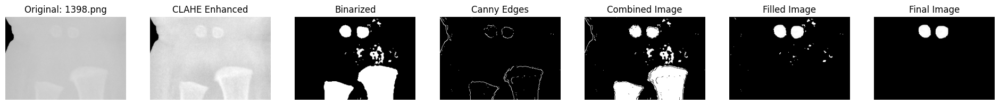

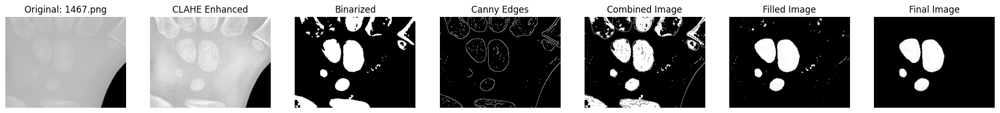

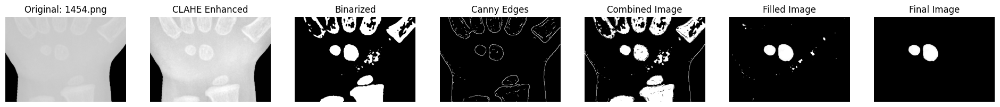

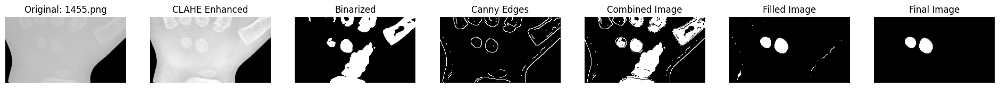

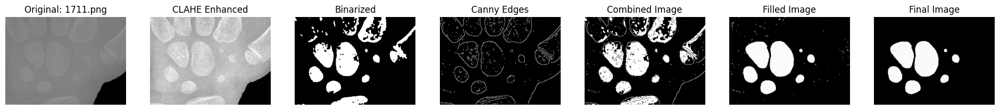

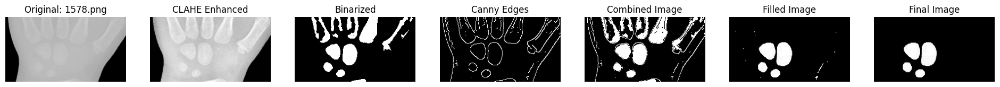

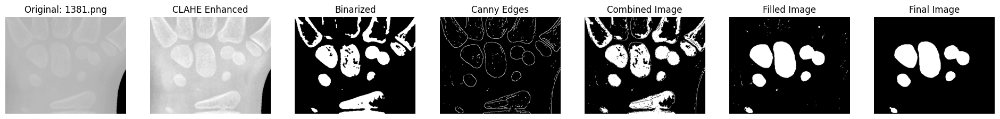

In [ ]:
import cv2
import os
import numpy as np
import matplotlib.pyplot as plt

# Define directories
filled_images_dir = '/content/drive/MyDrive/FYP - Nexero/ProcessedImages/filled_images'
input_dir = '/content/drive/MyDrive/FYP - Nexero/Implementation/lower_hand_region'

# List of specific filenames to process
specific_files = ['1398.png', '1467.png', '1454.png', '1455.png', '1711.png', '1578.png', '1381.png']

# Function to detect and mark circular or elliptical objects in images
def detect_and_mark_objects(image):
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    clahe = cv2.createCLAHE(clipLimit=2, tileGridSize=(5, 5))
    enhanced = clahe.apply(gray)
    blurred = cv2.medianBlur(enhanced, 5)
    edges = cv2.Canny(blurred, 30, 30)
    contours, _ = cv2.findContours(edges, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)
    result = image.copy()
    for contour in contours:
        if len(contour) >= 5:
            ellipse = cv2.fitEllipse(contour)
            center, axes, orientation = ellipse
            major_axis, minor_axis = axes
            aspect_ratio = major_axis / minor_axis
            if 0.8 < aspect_ratio < 1.2:
                cv2.ellipse(result, ellipse, (0, 255, 0), 2)
    return result, enhanced, edges

# Function to equalize and binarize the image
def equalize_and_binarize(image, threshold_value=58):
    gray_image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    equalized_image = cv2.equalizeHist(gray_image)
    smoothed_image = cv2.bilateralFilter(equalized_image, d=7, sigmaColor=75, sigmaSpace=75)
    _, binary_image = cv2.threshold(smoothed_image, threshold_value, 255, cv2.THRESH_BINARY)
    return equalized_image, smoothed_image, binary_image

# Function to fill holes in the binary image
def fill_holes(binary_image):
    inverted_binary = cv2.bitwise_not(binary_image)
    h, w = binary_image.shape
    mask = np.zeros((h+2, w+2), np.uint8)
    cv2.floodFill(inverted_binary, mask, (0, 0), 255)
    filled_image = cv2.bitwise_not(inverted_binary)
    return filled_image

# Function to fill holes in the combined image and remove border-touching objects
def fill_surrounded_holes(combined_image):
    kernel = np.ones((3, 3), np.uint8)
    dilated = cv2.dilate(combined_image, kernel, iterations=1)
    filled_image = fill_holes(dilated)
    eroded = cv2.erode(filled_image, kernel, iterations=1)
    h, w = eroded.shape
    contours, _ = cv2.findContours(eroded, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    for cnt in contours:
        x, y, width, height = cv2.boundingRect(cnt)
        if x == 0 or y == 0 or (x + width) == w or (y + height) == h:
            cv2.drawContours(eroded, [cnt], -1, 0, thickness=cv2.FILLED)
    return eroded

# Function to remove small noise and contours
def remove_small_objects(image, min_area=150):
    kernel = np.ones((3, 3), np.uint8)
    opened = cv2.morphologyEx(image, cv2.MORPH_OPEN, kernel, iterations=2)
    contours, _ = cv2.findContours(opened, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    mask = np.zeros_like(image)
    for cnt in contours:
        area = cv2.contourArea(cnt)
        if area >= min_area:
            cv2.drawContours(mask, [cnt], -1, 255, thickness=cv2.FILLED)
    filtered_image = cv2.bitwise_and(opened, mask)
    return filtered_image

# Process each specified image in the directory
for filename in specific_files:
    file_path = os.path.join(input_dir, filename)
    image = cv2.imread(file_path)

    threshold_value = 200
    equalized_image, smoothed_image, binary_image = equalize_and_binarize(image, threshold_value)
    marked_image, enhanced_image, edges_image = detect_and_mark_objects(image)
    combined_image = cv2.bitwise_xor(binary_image, edges_image)

    # Read the filled image from the filled_images_dir
    filled_image_path = os.path.join(filled_images_dir, filename)
    if os.path.exists(filled_image_path):
        filled_image = cv2.imread(filled_image_path, cv2.IMREAD_GRAYSCALE)
        final_image = remove_small_objects(filled_image, min_area=100)

        # Display all results in one row
        plt.figure(figsize=(24, 12))
        plt.subplot(1, 7, 1)
        plt.title(f'Original: {filename}')
        plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
        plt.axis('off')

        plt.subplot(1, 7, 2)
        plt.title('CLAHE Enhanced')
        plt.imshow(enhanced_image, cmap='gray')
        plt.axis('off')

        plt.subplot(1, 7, 3)
        plt.title('Binarized')
        plt.imshow(binary_image, cmap='gray')
        plt.axis('off')

        plt.subplot(1, 7, 4)
        plt.title('Canny Edges')
        plt.imshow(edges_image, cmap='gray')
        plt.axis('off')

        plt.subplot(1, 7, 5)
        plt.title('Combined Image')
        plt.imshow(combined_image, cmap='gray')
        plt.axis('off')

        plt.subplot(1, 7, 6)
        plt.title('Filled Image')
        plt.imshow(filled_image, cmap='gray')
        plt.axis('off')

        plt.subplot(1, 7, 7)
        plt.title('Final Image')
        plt.imshow(final_image, cmap='gray')
        plt.axis('off')

        plt.show()


## carpal bone segmentation

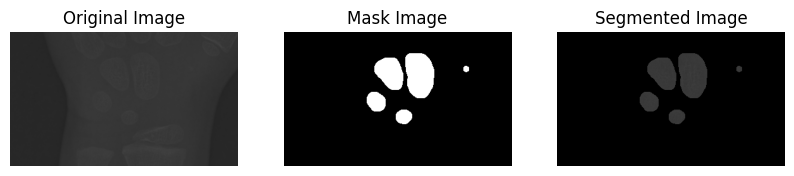

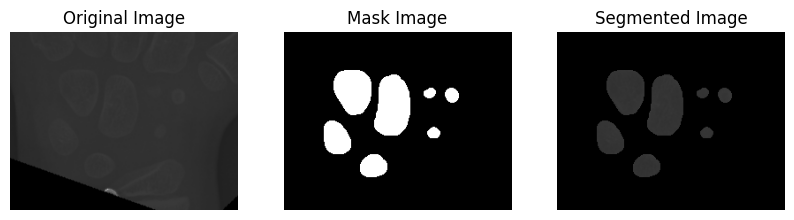

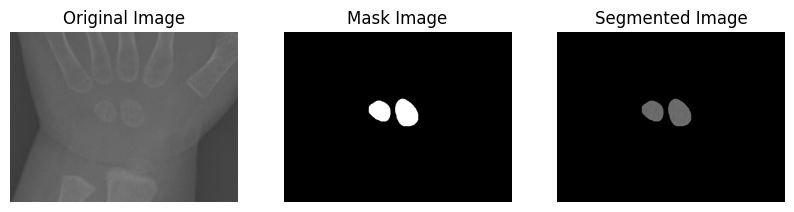

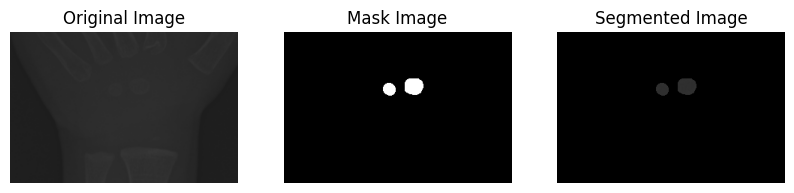

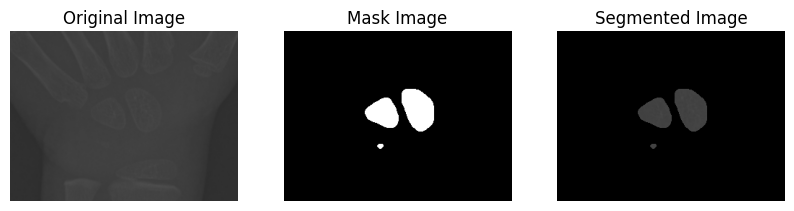

...

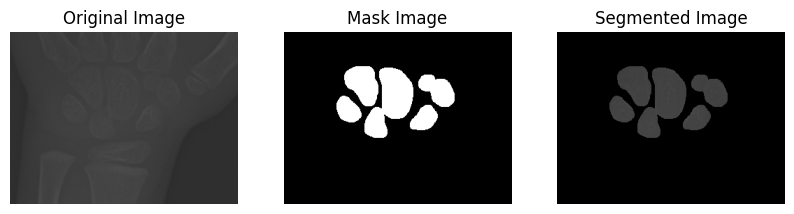

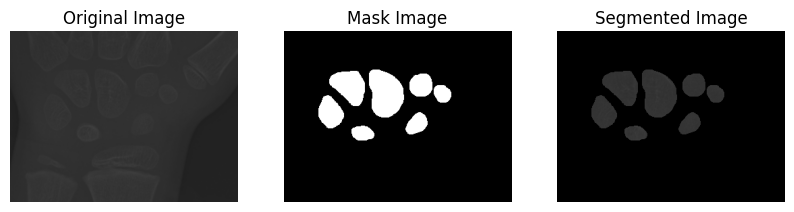

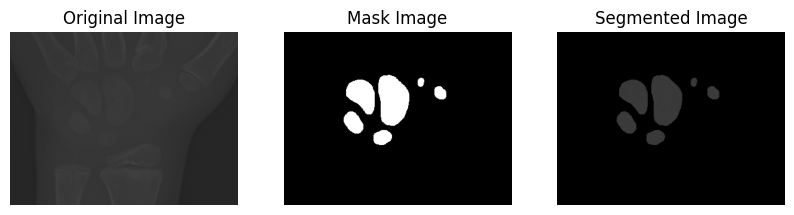

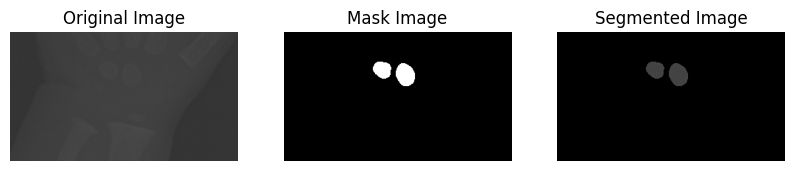

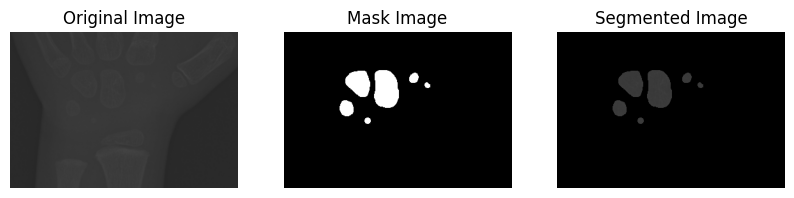

In [ ]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Directories
original_training_dir = '/content/drive/MyDrive/FYP - Nexero/BAA model/Dataset/Training_Validation/Combined/training'
original_validation_dir = '/content/drive/MyDrive/FYP - Nexero/BAA model/Dataset/Training_Validation/Combined/validation'
masked_training_dir = '/content/drive/MyDrive/FYP - Nexero/BAA model/Dataset/Training_Validation/Mask/Training'
masked_val_dir = '/content/drive/MyDrive/FYP - Nexero/BAA model/Dataset/Training_Validation/Mask/Validation'
segmented_training_dir = '/content/drive/MyDrive/FYP - Nexero/BAA model/Dataset/Training_Validation/Segment/Training'
segmented_val_dir = '/content/drive/MyDrive/FYP - Nexero/BAA model/Dataset/Training_Validation/Segment/Validation'

# Create directories if they don't exist
os.makedirs(segmented_training_dir, exist_ok=True)
os.makedirs(segmented_val_dir, exist_ok=True)

def segment_and_display_images(original_dir, mask_dir, segmented_dir, num_display=20):
    count = 0
    for filename in os.listdir(original_dir):
        original_path = os.path.join(original_dir, filename)
        mask_path = os.path.join(mask_dir, filename)

        if os.path.isfile(original_path) and os.path.isfile(mask_path):
            # Read the original and mask images
            original_img = cv2.imread(original_path)
            mask_img = cv2.imread(mask_path, cv2.IMREAD_GRAYSCALE)

            # Ensure the mask is binary
            _, mask_img = cv2.threshold(mask_img, 127, 255, cv2.THRESH_BINARY)

            # Apply the mask to segment the image
            segmented_img = cv2.bitwise_and(original_img, original_img, mask=mask_img)

            # Save the segmented image
            segmented_path = os.path.join(segmented_dir, filename)
            cv2.imwrite(segmented_path, segmented_img)

            # Display the first `num_display` results
            if count < num_display:
                plt.figure(figsize=(10, 10))

                plt.subplot(1, 3, 1)
                plt.imshow(cv2.cvtColor(original_img, cv2.COLOR_BGR2RGB))
                plt.title('Original Image')
                plt.axis('off')

                plt.subplot(1, 3, 2)
                plt.imshow(mask_img, cmap='gray')
                plt.title('Mask Image')
                plt.axis('off')

                plt.subplot(1, 3, 3)
                plt.imshow(cv2.cvtColor(segmented_img, cv2.COLOR_BGR2RGB))
                plt.title('Segmented Image')
                plt.axis('off')

                plt.show()

            count += 1

# Segment and display training images
segment_and_display_images(original_training_dir, masked_training_dir, segmented_training_dir)

# Segment and display validation images
segment_and_display_images(original_validation_dir, masked_val_dir, segmented_val_dir)


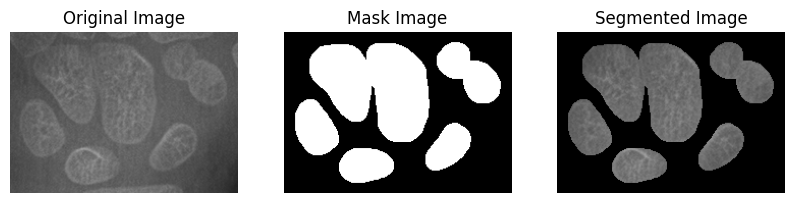

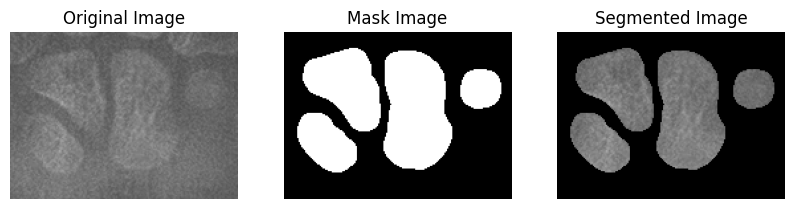

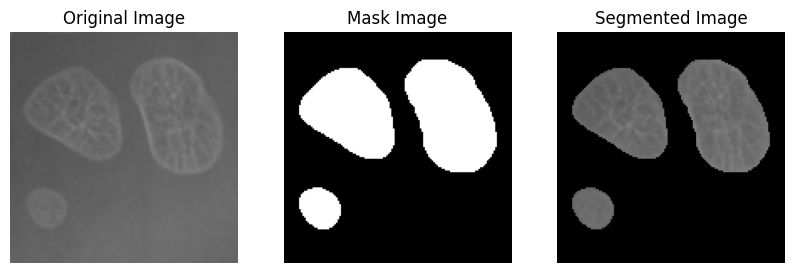

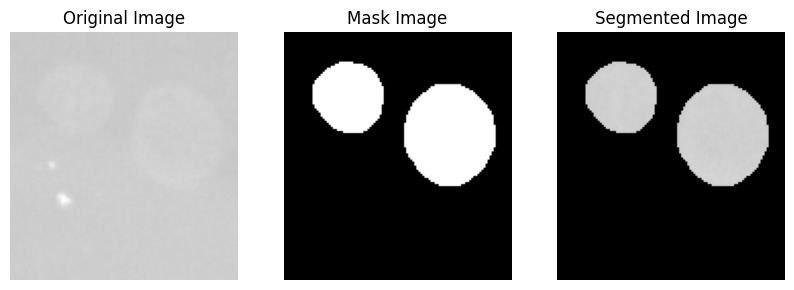

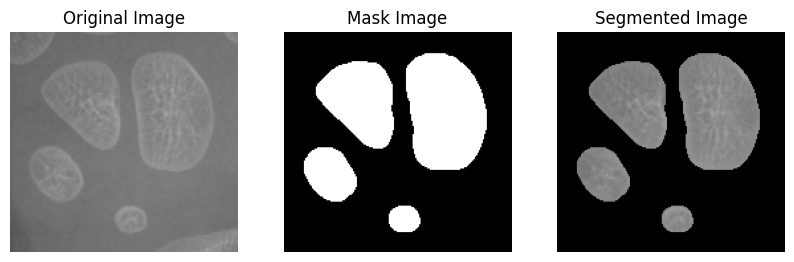

...

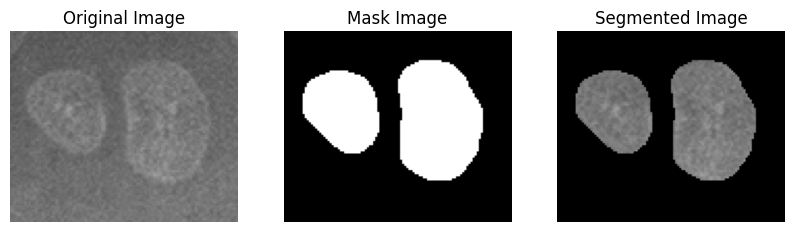

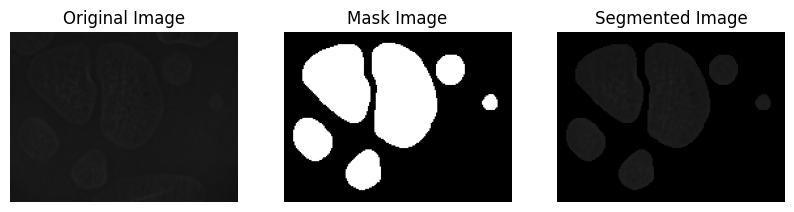

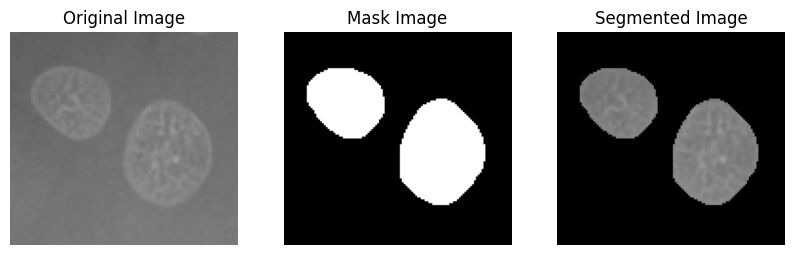

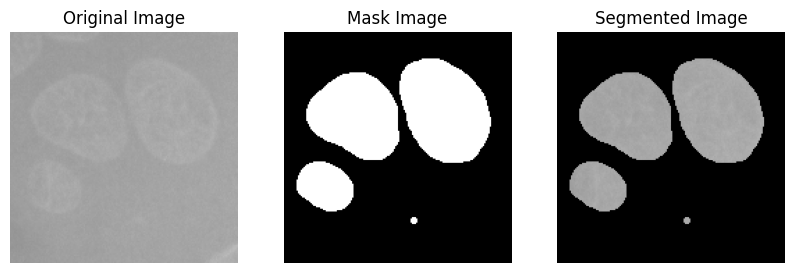

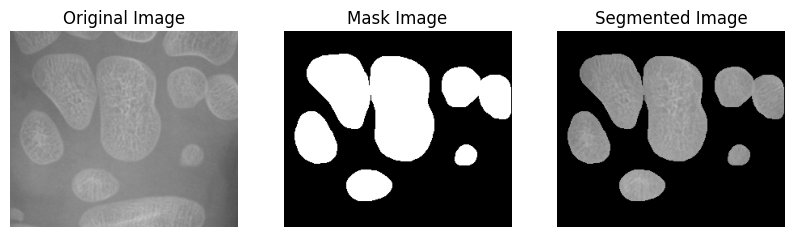

In [ ]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Directories
original_validation_dir = '/content/drive/MyDrive/FYP - Nexero/BAA model/Dataset/Training_Validation/Combined/validation'
masked_val_dir = '/content/drive/MyDrive/FYP - Nexero/BAA model/Dataset/Training_Validation/Mask/Validation'
segmented_val_dir = '/content/drive/MyDrive/FYP - Nexero/BAA model/Dataset/Training_Validation/Segment/Validation'

# Create directories if they don't exist
os.makedirs(segmented_val_dir, exist_ok=True)

def segment_and_display_images(original_dir, mask_dir, segmented_dir, num_display=20):
    count = 0
    for filename in os.listdir(original_dir):
        original_path = os.path.join(original_dir, filename)
        mask_path = os.path.join(mask_dir, filename)

        if os.path.isfile(original_path) and os.path.isfile(mask_path):
            # Read the original and mask images
            original_img = cv2.imread(original_path)
            mask_img = cv2.imread(mask_path, cv2.IMREAD_GRAYSCALE)

            # Ensure the mask is binary
            _, mask_img = cv2.threshold(mask_img, 127, 255, cv2.THRESH_BINARY)

            # Apply the mask to segment the image
            segmented_img = cv2.bitwise_and(original_img, original_img, mask=mask_img)

            # Save the segmented image
            segmented_path = os.path.join(segmented_dir, filename)
            cv2.imwrite(segmented_path, segmented_img)

            # Display the first `num_display` results
            if count < num_display:
                plt.figure(figsize=(10, 10))

                plt.subplot(1, 3, 1)
                plt.imshow(cv2.cvtColor(original_img, cv2.COLOR_BGR2RGB))
                plt.title('Original Image')
                plt.axis('off')

                plt.subplot(1, 3, 2)
                plt.imshow(mask_img, cmap='gray')
                plt.title('Mask Image')
                plt.axis('off')

                plt.subplot(1, 3, 3)
                plt.imshow(cv2.cvtColor(segmented_img, cv2.COLOR_BGR2RGB))
                plt.title('Segmented Image')
                plt.axis('off')

                plt.show()

            count += 1

# Segment and display validation images
segment_and_display_images(original_validation_dir, masked_val_dir, segmented_val_dir)


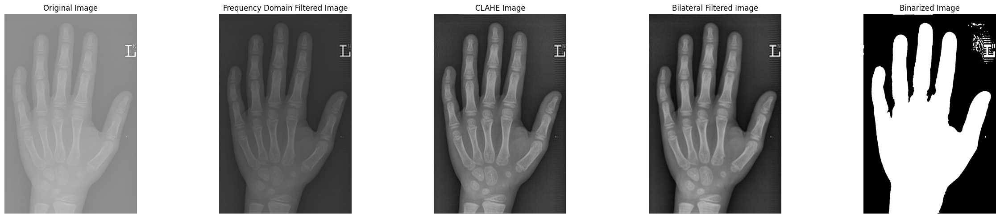

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import os

# Function to apply frequency domain filtering
def frequency_domain_filtering(image):
    # Convert to grayscale
    gray_image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

    # Perform FFT
    dft = cv2.dft(np.float32(gray_image), flags=cv2.DFT_COMPLEX_OUTPUT)
    dft_shift = np.fft.fftshift(dft)

    # Get the magnitude spectrum
    magnitude_spectrum = 20 * np.log(cv2.magnitude(dft_shift[:, :, 0], dft_shift[:, :, 1]))

    # Create a mask with high-pass filter
    rows, cols = gray_image.shape
    crow, ccol = rows // 2, cols // 2
    mask = np.zeros((rows, cols, 2), np.uint8)
    r = 90  # Radius of the high-pass filter
    center = [crow, ccol]
    x, y = np.ogrid[:rows, :cols]
    mask_area = (x - center[0]) ** 2 + (y - center[1]) ** 2 <= r*r
    mask[mask_area] = 1

    # Apply mask and inverse DFT
    fshift = dft_shift * mask
    f_ishift = np.fft.ifftshift(fshift)
    img_back = cv2.idft(f_ishift)
    img_back = cv2.magnitude(img_back[:, :, 0], img_back[:, :, 1])

    # Normalize the image
    img_back = cv2.normalize(img_back, None, 0, 255, cv2.NORM_MINMAX)

    return np.uint8(img_back)

# Load the target image
image_path = '/content/drive/MyDrive/FYP - Nexero/Implementation/input_images/1394.png'
image = cv2.imread(image_path)

# Apply frequency domain filtering
freq_filtered_image = frequency_domain_filtering(image)

# Apply CLAHE to the frequency domain filtered image
clahe = cv2.createCLAHE(clipLimit=2, tileGridSize=(3, 3))
clahe_equalized_image = clahe.apply(freq_filtered_image)

# Apply Bilateral Filter
bilateral_image = cv2.bilateralFilter(clahe_equalized_image, d=9, sigmaColor=75, sigmaSpace=75)

# Apply binary thresholding
_, binary_image = cv2.threshold(bilateral_image, 70, 250, cv2.THRESH_BINARY)

# Display the results
fig, axes = plt.subplots(1, 5, figsize=(25, 5))

axes[0].imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
axes[0].set_title('Original Image')
axes[0].axis('off')

axes[1].imshow(freq_filtered_image, cmap='gray')
axes[1].set_title('Frequency Domain Filtered Image')
axes[1].axis('off')

axes[2].imshow(clahe_equalized_image, cmap='gray')
axes[2].set_title('CLAHE Image')
axes[2].axis('off')

axes[3].imshow(bilateral_image, cmap='gray')
axes[3].set_title('Bilateral Filtered Image')
axes[3].axis('off')

axes[4].imshow(binary_image, cmap='gray')
axes[4].set_title('Binarized Image')
axes[4].axis('off')

plt.tight_layout()
plt.show()


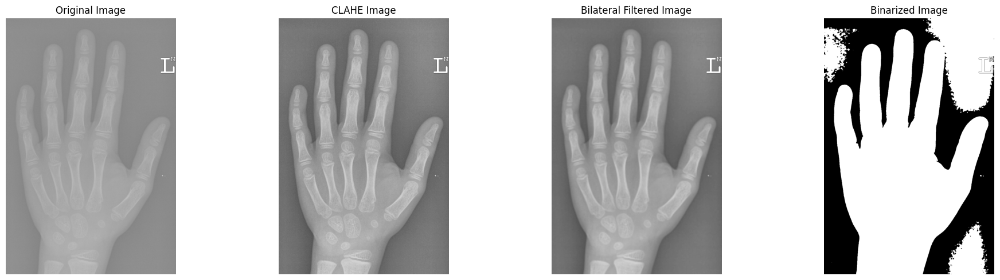

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import os

# Load the target image
image_path = '/content/drive/MyDrive/FYP - Nexero/Implementation/input_images/1394.png'
image = cv2.imread(image_path)

# Convert to grayscale for further processing
gray_image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

# Apply CLAHE
clahe = cv2.createCLAHE(clipLimit=2, tileGridSize=(3, 3))
clahe_equalized_image = clahe.apply(gray_image)

# Apply Bilateral Filter
bilateral_image = cv2.bilateralFilter(clahe_equalized_image, d=9, sigmaColor=75, sigmaSpace=75)

# Apply binary thresholding
_, binary_image = cv2.threshold(bilateral_image, 120, 250, cv2.THRESH_BINARY)

# Display the results
fig, axes = plt.subplots(1, 4, figsize=(20, 5))

axes[0].imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
axes[0].set_title('Original Image')
axes[0].axis('off')

axes[1].imshow(clahe_equalized_image, cmap='gray')
axes[1].set_title('CLAHE Image')
axes[1].axis('off')

axes[2].imshow(bilateral_image, cmap='gray')
axes[2].set_title('Bilateral Filtered Image')
axes[2].axis('off')

axes[3].imshow(binary_image, cmap='gray')
axes[3].set_title('Binarized Image')
axes[3].axis('off')

plt.tight_layout()
plt.show()
